<hr style="border: solid 3px Indigo;">

<h2 style='height:40px;text-align:center;font-size:30px;background-color:red;border:20px;color:white'>


# <center><span style="font-family:Arial; font-style: italic;">Text Clustering.</span></center>

## Contents
* [problem defination](#1)
* [Import Libraries](#2)
* [Prepare the data](#3)
* [Preprocessing and Data Cleaning](#4)
* [Feature Engineering](#5)
  - [bag of words](#6)
  - [TF-ID](#7)
  - [Word-Embedding pretraining model](#8)
  - [Word-Embedding model](#9)
  - [LDA](#10)
  - [Coherence](#11)
* [Models](#12)
  - [Non Hierarchical model](#13)
    - [K-means model](#14)
    - [Expectation–maximization algorithm](#15)
  - [Hierarchical mode](#16)
* [Perform Evaluations](#17)
  - [get Coherence for models](#18)
  - [get Cohen kappa Score](#19)
  - [Cosistency](#20)
  - [TSNE Plot](#21)
* [Compare and decide which algorithm is performing as the champion model](#22)
* [Error-Analysis](#23)






<hr style="border: solid 3px Brown;">
<a id="1"></a> <br>

## <center><span style="font-family:Arial; font-style: italic;">Problem Defination</span></center>
the goal of this notebook is building text Cluster and apply multi features engineering techniques like Bog of word , TF-IDF ,LDA and Word-Embedding and multi cluster model like kmean, em and Hierarchical  

<hr style="border: solid 3px Brown;">
<a id="2"></a> <br>

## <center><span style="font-family:Arial; font-style: italic;">Import Libraries</span></center>

In [125]:
!pip install wordcloud
!python -m spacy download en_core_web_lg
!pip install gensim
!pip install pyLDAvis

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 400.7 MB 5.1 kB/s 
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_lg')
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [126]:
import numpy as np
import pandas as pd

import re
from random import sample

import matplotlib.pyplot as plt 
import seaborn as sns

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import silhouette_score
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics.cluster import v_measure_score
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

from wordcloud import WordCloud
import spacy
import scipy.cluster.hierarchy as sch
from scipy.spatial.distance import squareform, pdist
import en_core_web_lg
nlp = en_core_web_lg.load()

from gensim.models import Word2Vec
from time import time  # To time our operations

from yellowbrick.cluster import InterclusterDistance
from yellowbrick.cluster import KElbowVisualizer

import nltk
from nltk.corpus import gutenberg 

from collections import Counter  # to get the most common words in a string 

import pyLDAvis
import pyLDAvis.gensim_models as gensimvis

from gensim.models.coherencemodel import CoherenceModel
from gensim.models.ldamodel import LdaModel
from gensim.corpora.dictionary import Dictionary

from funcy.flow import ignore
vocab = Counter()
sns.set()

In [127]:
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('gutenberg')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package gutenberg to /root/nltk_data...
[nltk_data]   Package gutenberg is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

<hr style="border: solid 3px Brown;">
<a id="3"></a> <br>

## <center><span style="font-family:Arial; font-style: italic;">load the data</span></center>

### Getting Book names.

In [128]:
books = gutenberg.fileids()
print(books)

['austen-emma.txt', 'austen-persuasion.txt', 'austen-sense.txt', 'bible-kjv.txt', 'blake-poems.txt', 'bryant-stories.txt', 'burgess-busterbrown.txt', 'carroll-alice.txt', 'chesterton-ball.txt', 'chesterton-brown.txt', 'chesterton-thursday.txt', 'edgeworth-parents.txt', 'melville-moby_dick.txt', 'milton-paradise.txt', 'shakespeare-caesar.txt', 'shakespeare-hamlet.txt', 'shakespeare-macbeth.txt', 'whitman-leaves.txt']


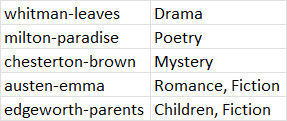

In [129]:
chosen_books = ['austen-emma.txt', 'whitman-leaves.txt', 'milton-paradise.txt', 'edgeworth-parents.txt', 'chesterton-brown.txt']
genres={'whitman-leaves.txt':'Drama','milton-paradise.txt':'Poetry','chesterton-brown.txt':'Mystery','austen-emma.txt':'Romance, Fiction','edgeworth-parents.txt':'Children, Fiction'}

<hr style="border: solid 3px Brown;">
<a id="4"></a> <br>

## <center><span style="font-family:Arial; font-style: italic;">Preprocessing and Data Cleaning</span></center>

### Function to remove headlines and titles

In [130]:
def remove_head(paras):
    """
    INPUT:
    paras: list of paragraphs, each paragraph is a list of sentences,
     and each sentence is a list of words.

    OUTPUT:
    new_paras: the same as paras but after removing headlines and titles
      
    """
    new_paras = []
    for para in paras:
        para_len = 0
        for sent in para:
            para_len += len(sent)
        if para_len > 15:
            new_paras.append(para)    
    return new_paras

### Function to convert paragraphs to a list of words

In [131]:
def para_to_list(paras):
    list1 = []
    for para in paras:
      for sent in para:
        for word in sent:
            list1.append(word)
    return list1

### Function to convert string to a list of words

In [132]:
def str_to_list(text):
    list1 = re.split(r"\s+", text)
    return list1

### Function to clean the text

In [133]:
def clean(text, flg_stemm, flg_stop):
    """
    INPUT:
    text: string of a text to be cleaned
    flg_stemm: bool to indicate whether stemming is to be applied
    flg_stop: bool to indicate whether to remoe stop words or not

    OUTPUT:
    new_text: list of words after cleaning, removing stop words, stemming

    """

    # Removing special characters, digits, and extra spaces
    new_text = re.sub(r"[^a-zA-Z']", ' ', text)
    new_text = re.sub(r"\s'|'\s", ' ', new_text)
    print(f"The total number of words after removing special characters and digits is: {len(str_to_list(new_text))}")

    # Converting to lower case
    new_text = new_text.lower()

    # Tokenize the string
    new_text = str_to_list(new_text)

    # Removing stop words
    if flg_stop == True:
        lst_stopwords = nltk.corpus.stopwords.words("english")
        new_text = [word for word in new_text if word not in lst_stopwords]
        print(f"The total number of words after removing stop words is: {len(new_text)}")

    # Stemming
    if flg_stemm == True:
        ps = nltk.stem.porter.PorterStemmer()
        new_text = [ps.stem(word) for word in new_text]

    return new_text

### Function to divide the book into n words partitions base on words_num is given to function 

In [134]:
def divide(list1, words_num):
    """
    INPUT: 
    list1: list of words
    words_num: number of words in each partition

    OUTPUT:
    partitions: list of partitions, each partition is a list of specific number of words.
    """
    partitions = []
    for i in range(0,len(list1)//words_num):
        partitions.append(list1[i*words_num:(i+1)*words_num])
    return partitions

### Function to put the partitions into dataframe

In [135]:
def put_df(partitions, book, part_num,genres):
    """
    INPUT:
    partitions: list of specific number of partitions, each partition is a list of specific number of words.
    book: the name of the book
    part_num: the number of partitions
    
    OUTPUT:
    df: The dataframe containing the text, list of words in the text, and book name.
    """
    list_partitions = []
    for part in partitions:
        list_partitions.append(' '.join(part))
    df = pd.DataFrame(list_partitions,columns=['text'])
    df['list_of_words'] = df['text'].apply(lambda x:x.split(' '))
    df['book_name'] = [re.split('[.]',book)[0]]*part_num
    df['genres']=[genres[book]]*part_num
    return df

### Functions to make dataframe containing n random partitions by default 200 partations from each book in a list of books

In [136]:
def make_df(list_books,genres, words_num=100, part_num=200, flg_stemm=True, flg_stop=True ):
    """
    INPUT:
    list_books: list of books to get the text from
    words_num: the number of words per partition
    part_num: the number of partitions per book
    flg_stemm: bool to indicate whether stemming is to be applied
    flg_stop: bool to indicate whether to remoe stop words or not
    genres:list of genres for books to put it in data frame

    OUTPUT:
    df: The data frame contains n partitions from each book in the list of books

    """

    books_in_df = 0
    df = pd.DataFrame(columns=['text', 'list_of_words', 'book_name' ,'genres'])
    for book in list_books:

        print(f"Working with {re.split(r'[.]',book)[0]} book")

        #Removing headlines and titles
        paras = gutenberg.paras(book)
        print("The total number of paragraphs before removing headlines: {}".format(len(paras)))
        new_paras = remove_head(paras)
        print("The total number of paragraphs after removing headlines: {}".format(len(new_paras)))
    
        # Converting paragraphs to list of words
        list_words = para_to_list(new_paras)
        print("The total number of words is: {} ".format(len(list_words)))

        # Cleaning the text
        text = ' '.join(list_words)
        new_text = clean(text, flg_stemm, flg_stop)

        # Dividing the text into n words partitions
        partitions = divide(new_text, words_num)
        print(f"The total number of partitions is {len(partitions)}")

        # Choosing n random partitions and put them into the dataframe
        if len(partitions) < part_num:
            print("The total number of partitions in the book is less than {} partitions".format(part_num))
        else:
            chosen = sample(partitions, part_num)
            book_df = put_df(chosen, book, part_num,genres)
            df = pd.concat([df, book_df])
        print()
    df =df.reset_index(drop=True)
    return df

### Putting books into the dataframe

In [137]:
df = make_df(chosen_books,genres, part_num=200, words_num=150)

Working with austen-emma book
The total number of paragraphs before removing headlines: 2371
The total number of paragraphs after removing headlines: 2075
The total number of words is: 189860 
The total number of words after removing special characters and digits is: 160035
The total number of words after removing stop words is: 72313
The total number of partitions is 482

Working with whitman-leaves book
The total number of paragraphs before removing headlines: 2478
The total number of paragraphs after removing headlines: 2027
The total number of words is: 152100 
The total number of words after removing special characters and digits is: 124244
The total number of words after removing stop words is: 63893
The total number of partitions is 425

Working with milton-paradise book
The total number of paragraphs before removing headlines: 29
The total number of paragraphs after removing headlines: 15
The total number of words is: 96791 
The total number of words after removing special char

### Printing sample from the dataframe

In [138]:
df.sample(10)

,text,list_of_words,book_name,genres
616,yesterday make bed wish might abl buy next win...,"[yesterday, make, bed, wish, might, abl, buy, ...",edgeworth-parents,"Children, Fiction"
5,despair equal allianc address miss smith madam...,"[despair, equal, allianc, address, miss, smith...",austen-emma,"Romance, Fiction"
134,think friend must sorri lose colonel mr campbe...,"[think, friend, must, sorri, lose, colonel, mr...",austen-emma,"Romance, Fiction"
203,corps stretch bed live look upon palpabl live ...,"[corps, stretch, bed, live, look, upon, palpab...",whitman-leaves,Drama
864,fenc grey everyth look almost spoke huge figur...,"[fenc, grey, everyth, look, almost, spoke, hug...",chesterton-brown,Mystery
857,restrain astonish unlik would shown huge obvio...,"[restrain, astonish, unlik, would, shown, huge...",chesterton-brown,Mystery
909,grasp bunch lili valley cri creatur passag tri...,"[grasp, bunch, lili, valley, cri, creatur, pas...",chesterton-brown,Mystery
661,ornament bower fate decid excess hot mind enga...,"[ornament, bower, fate, decid, excess, hot, mi...",edgeworth-parents,"Children, Fiction"
863,got properti man use old feudal fabl properli ...,"[got, properti, man, use, old, feudal, fabl, p...",chesterton-brown,Mystery
539,good thi great question blasphem without defen...,"[good, thi, great, question, blasphem, without...",milton-paradise,Poetry


<hr style="border: solid 3px Brown;">
<a id="5"></a> <br>

## <center><span style="font-family:Arial; font-style: italic;">Feature Engineering</span></center>

<a id="6"></a> <br>
### bag of words

In [139]:
def getBOW(train_corpus):
    "it take train corpus and return train features"
    # build BOW features on train articles
    cv = CountVectorizer(binary=False, min_df=0.0, max_df=1.0)
    cv_train_features = cv.fit_transform(train_corpus).toarray()
    return cv_train_features


<a id="7"></a> <br>
### TF-IDF

In [140]:
def getTF_IDF(train_corpus):
    "it take train corpus and return train features"
    # build BOW features on train articles
    tv = TfidfVectorizer(use_idf=True, min_df=0.0, max_df=1.0)
    tv_train_features = tv.fit_transform(train_corpus).toarray()
    return tv_train_features


<a id="8"></a> <br>
### Word-Embedding pretraining model 

In [141]:
def get_WordEmbeddingSpacy(wordList):
    """
    Function : get_WordEmbeddingSpacy
    Used to convert words from text shape to vector numberic representation using spacy library
    ---------------------------------
    Input : 
    wordList 
    ---------------------------------
    Output :wordEmbeddingData 
    """
    
    wordEmbeddingData=lst = [[]] * len(wordList)
    vectorPartiton =  [[]] * len(wordList[0])
 
    for partitionIndex, partition in enumerate(wordList):
      for Word_index, word in enumerate(partition):
        vectorPartiton[Word_index]=nlp(word).vector
      wordEmbeddingData[partitionIndex]=np.array(vectorPartiton)  

    return np.array(wordEmbeddingData)


<a id="9"></a> <br>
### Word-Embedding model

In [142]:
def vectorize(list_of_docs, model, strategy):
    """Generate vectors for list of documents using a Word Embedding.

    Args:
        list_of_docs: List of documents.
        model: Gensim Word Embedding.
        strategy: Aggregation strategy ("average", or "min-max".)

    Raises:
        ValueError: If the strategy is other than "average" or "min-max".

    Returns:
        List of vectors.
    """
    features = []
    size_output = model.vector_size
    embedding_dict = model

    if strategy == "min-max":
        size_output *= 2

    if hasattr(model, "wv"):
        embedding_dict = model.wv

    for tokens in list_of_docs:
        zero_vector = np.zeros(size_output)
        vectors = []
        for token in tokens:
            if token in embedding_dict:
                try:
                    vectors.append(embedding_dict[token])
                except KeyError:
                    continue
        if vectors:
            vectors = np.asarray(vectors)
            if strategy == "min-max":
                min_vec = vectors.min(axis=0)
                max_vec = vectors.max(axis=0)
                features.append(np.concatenate((min_vec, max_vec)))
            elif strategy == "average":
                avg_vec = vectors.mean(axis=0)
                features.append(np.array(avg_vec))
            else:
                raise ValueError(f"Aggregation strategy {strategy} does not exist!")
        else:
            features.append(zero_vector)
    return np.array(features)

In [143]:
def get_WordEmbeddingGensim(wordList):


  """
    Function : get_WordEmbeddingGensim
    Used to convert words from text shape to vector numberic representation using Gensim library by training 
    our vector model on our data
    ---------------------------------
    Input : 
    wordList 
    ---------------------------------
    Output :wordEmbeddingData 
    """
  #Initialize the model   
  w2v_model = Word2Vec(min_count=1,size=300, workers=1, seed=42)
  
  #Building the Vocabulary Table:
  t = time()
  w2v_model.build_vocab(wordList, progress_per=10000)
  print('Time to build vocab: {} mins'.format(round((time() - t) / 60, 2)))   
  
  #Training of the model
  t = time()
  w2v_model.train(wordList, total_examples=w2v_model.corpus_count, epochs=30, report_delay=1)
  print('Time to train the model: {} mins'.format(round((time() - t) / 60, 2)))

  vectorized_docs = vectorize(list_of_docs=wordList, model=w2v_model, strategy="average")
 
   
  return vectorized_docs

<a id="10"></a> <br>
### LDA function 

In [144]:
def get_LDA(X,components):
    """
    input  : X is the train text , components is the number of topics 
    output : features as a dataframe
    """
    count_vect = CountVectorizer(max_df=0.8, min_df=2, stop_words='english')
    doc_term_matrix = count_vect.fit_transform(X)
    LDA = LatentDirichletAllocation(n_components=components, random_state=42)
    LDA.fit(doc_term_matrix)
    topic_values = LDA.transform(doc_term_matrix)
    pd.options.display.float_format = '{:,.3f}'.format
    dt_df = pd.DataFrame(topic_values,columns=['T'+str(i) for i in range(1, components+1)])
    return dt_df

<a id="11"></a> <br>
### Coherence

In [145]:
# pyLDAvis.enable_notebook()
def visualizeTopics(X,N_topics):
    """
    input  : take the corpus as a text , number of topics 
    output : visualize the lda topics , and return the coherence 
    """
    pyLDAvis.enable_notebook()
    # get list of ( list of words ) from the corpus 
    texts = []
    for x in X :
        texts.append(x.split(" "))
    # get the dictionary 
    dictionary = Dictionary(texts)
    # prepare the features for LDA model 
    corpus = [dictionary.doc2bow(text) for text in texts]  # text is a list of lists [[word1,word2,...,wordn],...,[word1,word2,...,wordn]]
    
    # build LDA model 
    goodLdaModel = LdaModel(corpus=corpus, id2word=dictionary, iterations=50, num_topics=N_topics)
    
    goodcm = CoherenceModel(model=goodLdaModel, corpus=corpus, dictionary=dictionary, coherence='u_mass')
    goodcm2 = CoherenceModel(model=goodLdaModel, texts=texts, dictionary=dictionary, coherence='c_v')
    # feed the LDA model into the pyLDAvis instance
    lda_viz = gensimvis.prepare(goodLdaModel, corpus, dictionary)
    return lda_viz,goodcm.get_coherence(),goodcm2.get_coherence()

In [146]:
list_out=[]
list_out2=[]
for i in [3,5,8,10,13,15,18,20]:
  lda_viz,c,c2=visualizeTopics(df.iloc[:,0],i)
  list_out.append(c)
  list_out2.append(c2)

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

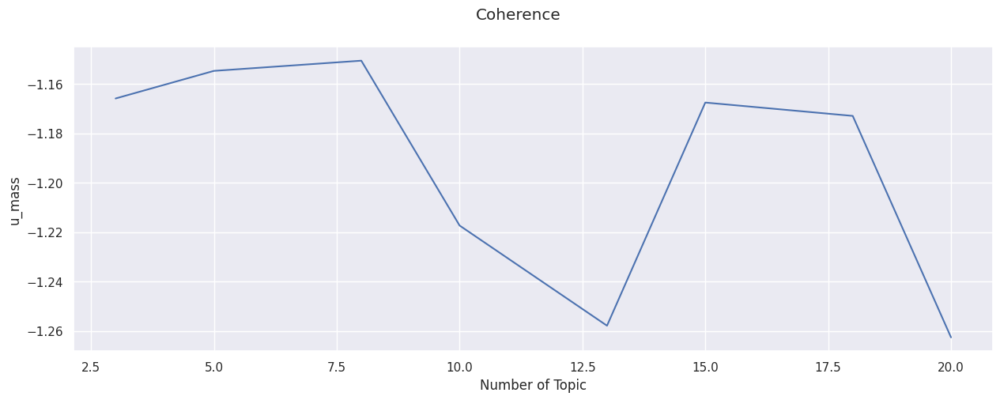

In [147]:
fig = plt.figure(figsize=(15, 5))
fig.suptitle('Coherence')



plt.plot([3,5,8,10,13,15,18,20],list_out)
plt.xlabel('Number of Topic')
plt.ylabel('u_mass')

#sub1 = plt.subplot(1, 2, 1)
#sub1.plot([3,5,8,10,13,15,18,20],list_out)
#sub1.set_xlabel('Number of Topic')
#sub1.set_ylabel('u_mass')

#sub2 = plt.subplot(1, 2, 2)
#sub2.plot([3,5,8,10,13,15,18,20],list_out2)
#sub2.set_xlabel('Number of Topic')
#sub2.set_ylabel('c_v')
plt.show()

In [148]:
lda_viz,c,c2=visualizeTopics(df.iloc[:,0],20)

/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

In [149]:
lda_viz

PreparedData(topic_coordinates=           x      y  topics  cluster   Freq
topic                                      
7      0.034 -0.006       1        1 15.324
17    -0.022 -0.033       2        1  8.675
12     0.008  0.048       3        1  8.280
2      0.017  0.013       4        1  8.074
14     0.001 -0.001       5        1  7.049
13     0.010  0.034       6        1  5.765
1     -0.012  0.001       7        1  5.509
4      0.016 -0.013       8        1  4.851
8     -0.028 -0.011       9        1  4.819
15     0.005  0.010      10        1  4.800
18     0.017 -0.014      11        1  4.566
6     -0.003 -0.001      12        1  3.795
19     0.007 -0.008      13        1  3.180
9      0.033 -0.013      14        1  2.860
3     -0.037 -0.009      15        1  2.848
11    -0.021 -0.000      16        1  2.456
5     -0.006 -0.020      17        1  2.112
0      0.025 -0.016      18        1  2.089
16    -0.036  0.021      19        1  1.629
10    -0.007  0.019      20        1  1.318, topic_info=       Term      Freq     Total Category  logprob  loglift
69       mr 1,120.000 1,120.000  Default   30.000   30.000
118   would   654.000   654.000  Default   29.000   29.000
274     see   559.000   559.000  Default   28.000   28.000
94     said 1,047.000 1,047.000  Default   27.000   27.000
2165    thi   324.000   324.000  Default   26.000   26.000
...     ...       ...       ...      ...      ...      ...
53     good     5.608   491.680  Topic20   -5.865   -0.144
104   think     5.437   439.366  Topic20   -5.896   -0.063
69       mr     6.759 1,120.563  Topic20   -5.678   -0.781
408   shall     5.073   491.936  Topic20   -5.965   -0.245
23     come     4.774   486.763  Topic20   -6.026   -0.295

[1657 rows x 6 columns], token_table=      Topic  Freq     Term
term                      
5752      2 0.177  abandon
5752      3 0.177  abandon
5752      5 0.177  abandon
5752     20 0.177  abandon
6102      1 0.329     abas
...     ...   ...      ...
119      16 0.022    young
119      17 0.022    young
119      18 0.035    young
119      19 0.009    young
119      20 0.013    young

[6259 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[8, 18, 13, 3, 15, 14, 2, 5, 9, 16, 19, 7, 20, 10, 4, 12, 6, 1, 17, 11])

### declare features engineering techniques and models they are used 

In [150]:
Features_Engneering_names=['BOW','TF-IDF','LDA','WordEmbeddingGensim']
models_names=['K-means','em','Hierarchical']
saved_file={}

### get data base on features engnieering techniques

In [151]:
def get_data(x,feature):
    """
    Function : get_data
    Used to transform it by feature engineering methods
    ---------------------------------
    Input : 
    x: is trainning data 
    feature: is the method it will be used to transform the data 
    ---------------------------------
    Output : X_train the the data after apply feature engineering with given methods  
    """
    
    if feature in saved_file.keys():
      X_train = np.load(saved_file[feature],allow_pickle=True)
      model=None
    else:
      if feature=='BOW':
          X_train = getBOW(x)
      elif feature=='TF-IDF':
          X_train= getTF_IDF(x)
      elif feature=='LDA':
          X_train= get_LDA(x,20)
      elif feature=='WordEmbeddingSpacy':
          X_train= get_WordEmbeddingSpacy(x)
      elif feature=='WordEmbeddingGensim':
          X_train= get_WordEmbeddingGensim(x)
      saved_file[feature]=feature+'.npy'
      np.save(saved_file[feature],X_train)
     
    return X_train
    


### get data after clean and features engineering 

In [152]:
saved_file={}
for feature in Features_Engneering_names:
  print('using {} in feature engineering'.format(feature))
  X_train= get_data(df.iloc[:,0], feature)
  print(X_train.shape)
  df_features=pd.DataFrame(X_train)
  display(df_features.head())




using BOW in feature engineering
(1000, 11522)


,0,1,2,3,4,5,6,7,8,9,...,11512,11513,11514,11515,11516,11517,11518,11519,11520,11521
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


using TF-IDF in feature engineering
(1000, 11522)


,0,1,2,3,4,5,6,7,8,9,...,11512,11513,11514,11515,11516,11517,11518,11519,11520,11521
0,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
1,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
2,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
3,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
4,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000


using LDA in feature engineering
(1000, 20)


,T1,T2,T3,T4,T5,T6,T7,T8,T9,T10,T11,T12,T13,T14,T15,T16,T17,T18,T19,T20
0,0.000,0.000,0.000,0.076,0.000,0.000,0.000,0.236,0.000,0.000,0.000,0.000,0.000,0.682,0.000,0.000,0.000,0.000,0.000,0.000
1,0.000,0.000,0.000,0.477,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.515,0.000,0.000,0.000,0.000,0.000,0.000
2,0.393,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.601,0.000,0.000,0.000,0.000,0.000,0.000
3,0.051,0.000,0.000,0.000,0.000,0.000,0.018,0.000,0.000,0.000,0.000,0.000,0.000,0.592,0.000,0.000,0.000,0.334,0.000,0.000
4,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.562,0.000,0.000,0.000,0.000,0.000,0.430


using WordEmbeddingGensim in feature engineering
Time to build vocab: 0.0 mins
Time to train the model: 0.19 mins
(1000, 300)


,0,1,2,3,4,5,6,7,8,9,...,290,291,292,293,294,295,296,297,298,299
0,-0.022,0.067,0.020,-0.038,-0.034,0.049,0.006,-0.025,0.049,0.041,...,-0.034,-0.006,-0.010,-0.002,0.008,0.033,0.030,-0.003,0.008,0.034
1,-0.025,0.076,0.025,-0.046,-0.032,0.047,0.001,-0.026,0.055,0.053,...,-0.040,-0.011,-0.016,0.007,0.009,0.023,0.020,-0.004,-0.002,0.034
2,-0.025,0.075,0.024,-0.047,-0.040,0.044,0.005,-0.026,0.046,0.040,...,-0.041,-0.008,-0.016,0.009,0.010,0.035,0.023,-0.006,0.008,0.036
3,-0.027,0.083,0.019,-0.050,-0.038,0.040,-0.012,-0.033,0.057,0.052,...,-0.047,-0.010,-0.023,0.006,0.020,0.033,0.013,-0.008,-0.006,0.041
4,-0.026,0.069,0.011,-0.036,-0.044,0.045,0.001,-0.027,0.048,0.027,...,-0.041,-0.002,-0.005,0.001,0.007,0.041,0.027,-0.006,0.002,0.040


<hr style="border: solid 3px Brown;">
<a id="12"></a> <br>

## <center><span style="font-family:Arial; font-style: italic;">Models </span></center>

In [153]:
X=df.iloc[:,0]
y=df.iloc[:,-2]

In [154]:
def model_viualzation(x,k,model_name,feature):
    """
    Function : model_viualzation
    Used to viualzation methods to detect the best k
    ---------------------------------
    Input : x: the data it will used to fit the model
            k: the larg number of k in viualzation
            model_name : model it used
            feature : feature methods it used 
    ---------------------------------
    Output : don't return 
    """
    #Hierarchical clustering
    print('{} with {} feature engineering methods'.format(model_name,feature))
    if model_name =="K-means": 
      plot_kmeans_elbow(x, k, feature)
    elif model_name =="em":
      plot_em_elbow(x, k, feature)
    elif model_name =="Hierarchical":
      model=Hierarchical_clustering_vi(x,k)

<a id="13"></a> <br>

### Non Hierarchical model

<a id="14"></a> <br>
#### K-means model

In [155]:
def kmeans_model(x, num_clusters):
  """
  INPUT:
  x: The training data
  num_clusters: The number of clusters

  OUTPUT:
  model: K-means model after fitting it with the training data

  """
  model = KMeans(n_clusters=num_clusters, init='k-means++', random_state=0)
  model.fit(x)
  return model

In [156]:
def plot_kmeans_elbow(x, max_clusters, features_name):
  """
  The function takes the training data and plot WCSS and silhouette versus the number of clusters

  INPUT:
  x: The training data
  max_clusters: The maximum number of clusters
  features_name: The name of used features that will appear in the title of the plot 

  """
  wcss = []
  s = []
  for i in range(1, max_clusters+1):
      model = kmeans_model(x, i)
      wcss.append(model.inertia_)
      if i>1:
        s.append(silhouette_score(x, model.labels_))

  fig = plt.figure(figsize=(15, 5))
  fig.suptitle('Elbow Method using ' + features_name + ' features')

  sub1 = plt.subplot(1, 2, 1)
  sub1.plot(range(1, max_clusters+1), wcss)
  sub1.set_xlabel('Number of clusters')
  sub1.set_ylabel('WCSS')

  sub2 = plt.subplot(1, 2, 2)
  sub2.plot(range(2, max_clusters+1), s)
  sub2.set_xlabel('Number of clusters')
  sub2.set_ylabel('silhouette')
  plt.show()

In [157]:
def viualzation(x,k,model_name,Features_Engneering_names):
  for feature in Features_Engneering_names:
    data=get_data(x,feature)   
    model_viualzation(data,k,model_name,feature)


K-means with BOW feature engineering methods


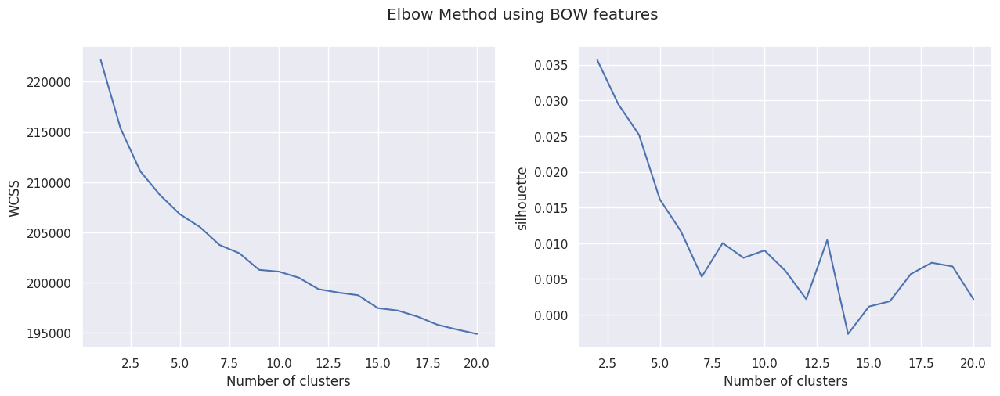

K-means with TF-IDF feature engineering methods


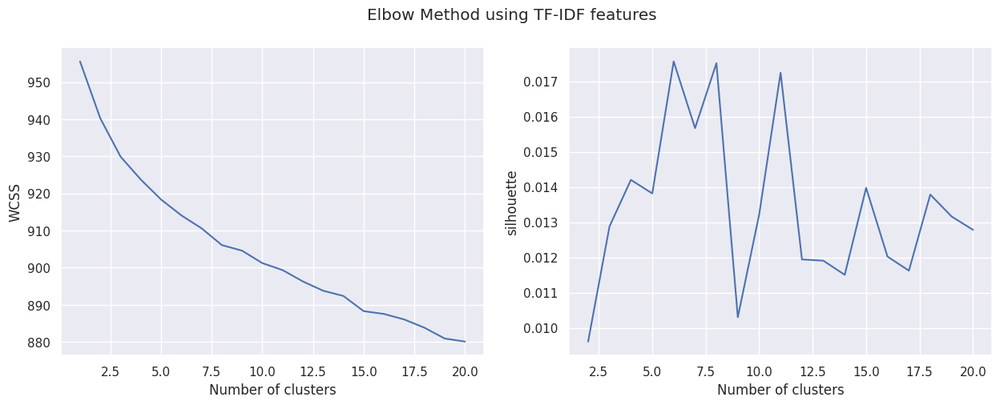

K-means with LDA feature engineering methods


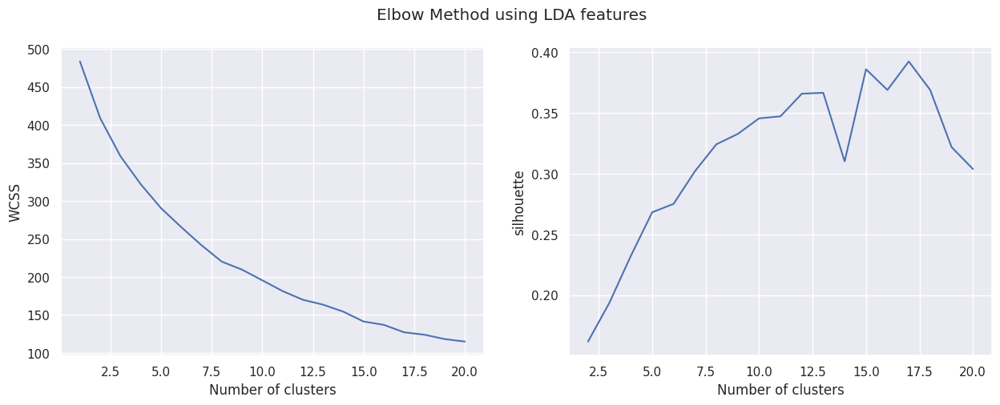

K-means with WordEmbeddingGensim feature engineering methods


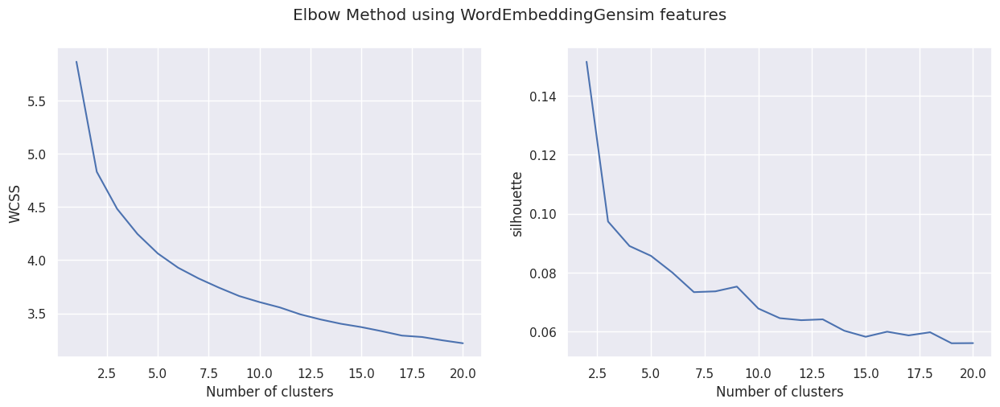

In [158]:
viualzation(X,20,models_names[0],Features_Engneering_names)

In [159]:
chosen_kmean = [13, 6, 15, 5]

<a id="15"></a> <br>
#### em model

In [160]:
def em_model(x, num_components):
  """
  INPUT:
  x: The training data
  num_components: The number of mixture components.

  OUTPUT:
  model: Gaussian mixture model after fitting it with the training data

  """
  model = GaussianMixture(n_components=num_components,covariance_type='diag', random_state=0)
  model.fit(x)
  return model

In [161]:
def plot_em_elbow(x, max_components, features_name):
  """
  The function takes the training data and plot AIC, BIC and silhouette versus the number of components

  INPUT:
  x: The training data
  max_components: The maximum number of components 
  features_name: The name of used features that will appear in the title of the plot 

  """
  s = []
  n_components = np.arange(1, max_components+1)
  models = [em_model(x, n) for n in n_components]
  for i in range(2, max_components+1):
    model = em_model(x, i)
    labels = model.predict(x)
    s.append(silhouette_score(x, labels))

  fig = plt.figure(figsize=(15, 5))
  fig.suptitle('Elbow Method using ' + features_name + ' features')
  sub1 = plt.subplot(1, 2, 1)
  sub1.plot(n_components, [m.bic(x) for m in models], label='BIC')
  sub1.plot(n_components, [m.aic(x) for m in models], label='AIC')
  sub1.set_xlabel('Number of components')
  sub1.legend(loc='best')

  sub2 = plt.subplot(1, 2, 2)
  sub2.plot(range(2, max_components+1), s)
  sub2.set_xlabel('Number of clusters')
  sub2.set_ylabel('silhouette')
  plt.show()
 

em with BOW feature engineering methods


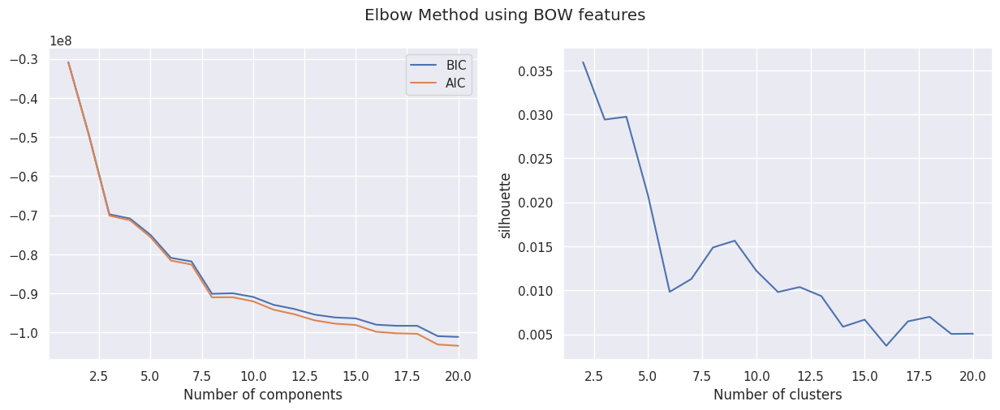

em with TF-IDF feature engineering methods


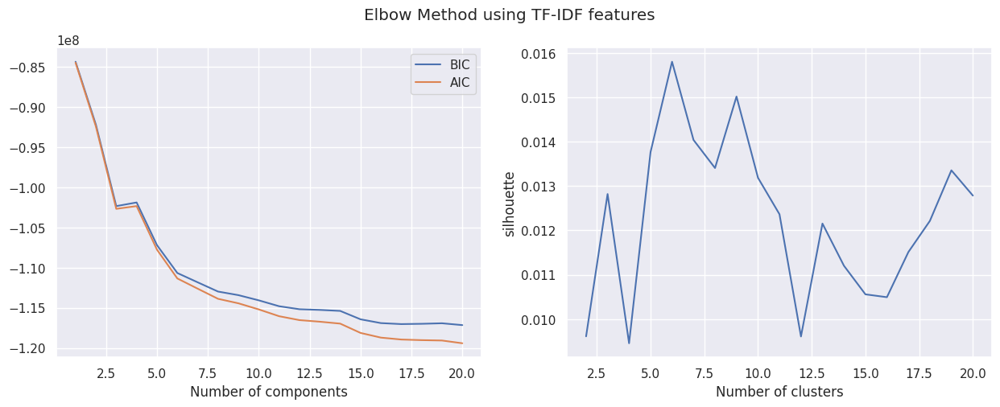

em with LDA feature engineering methods


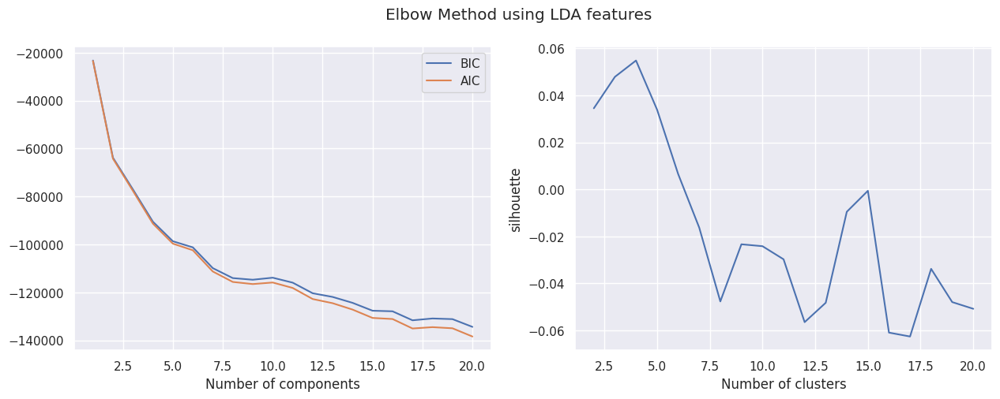

em with WordEmbeddingGensim feature engineering methods


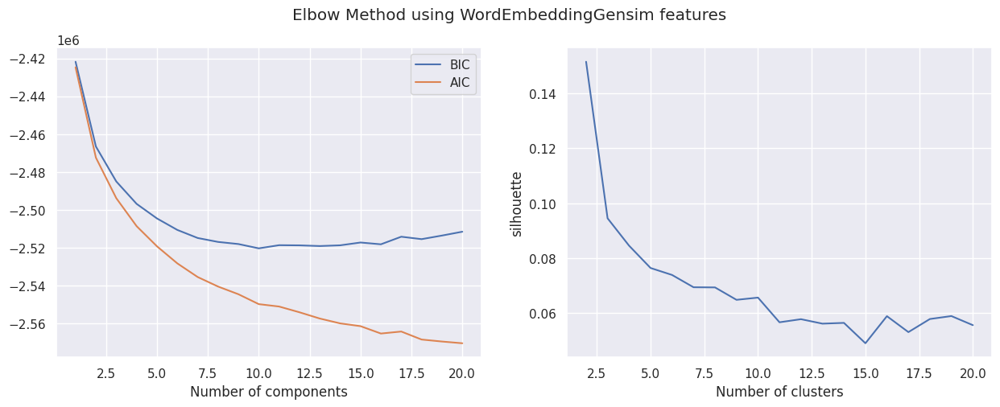

In [162]:
viualzation(X,20,models_names[1],Features_Engneering_names)

In [165]:
chosen_em = [8, 6, 5, 5]

<a id="16"></a> <br>
### Hierarchical model

In [170]:
def Hierarchical_clustering_vi(x,k):
    """
    Function : Hierarchical_clustering_vi
    Used to build Hierarchical cluster model and plot the dendrogram
    ---------------------------------
    Input : x the data it will be clutering
    k number of cluster it outcome from clustering methods 
    ---------------------------------
    Output : no thing 
    """
    dendrogram = sch.dendrogram(sch.linkage(x, method='ward'))
    plt.show()
    print('Elbow Method to determine the number of clusters to be formed:')
    hc = AgglomerativeClustering(affinity = 'euclidean', linkage = 'ward')
    Elbow_M = KElbowVisualizer(hc, k=k,timings=False,locate_elbow=False)
    Elbow_M.fit(x)
    Elbow_M.show()
    Elbow_M = KElbowVisualizer(hc, k=k,timings=False,metric='silhouette',locate_elbow=False)
    Elbow_M.fit(x)
    Elbow_M.show()

In [171]:
def Hierarchical_clustering_tr(x,k):
    """
    Function : Hierarchical_clustering
    Used to build Hierarchical cluster model and plot the dendrogram
    ---------------------------------
    Input : x the data it will be clutering
    k number of cluster it outcome from clustering methods 
    ---------------------------------
    Output : model 
    """
    # create clusters
    hc = AgglomerativeClustering(n_clusters=k, affinity = 'euclidean', linkage = 'ward')
    hc.fit(x)
    return hc


Hierarchical with BOW feature engineering methods


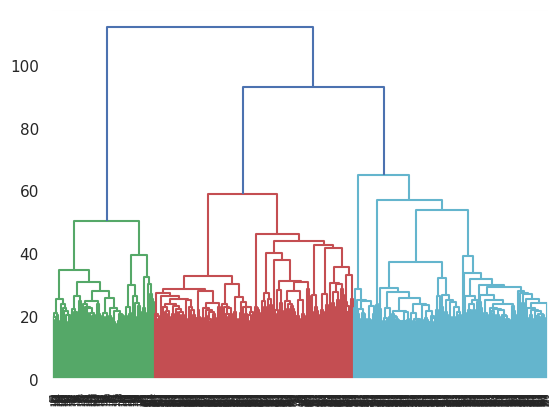

Elbow Method to determine the number of clusters to be formed:


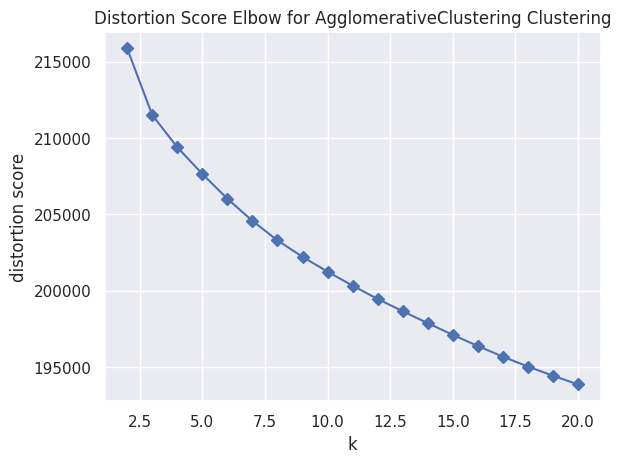

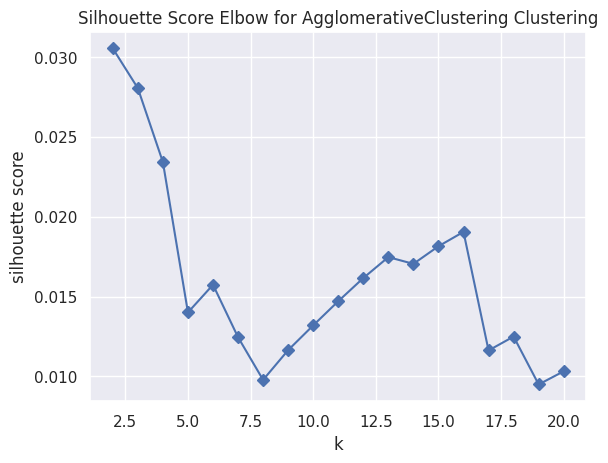

Hierarchical with TF-IDF feature engineering methods


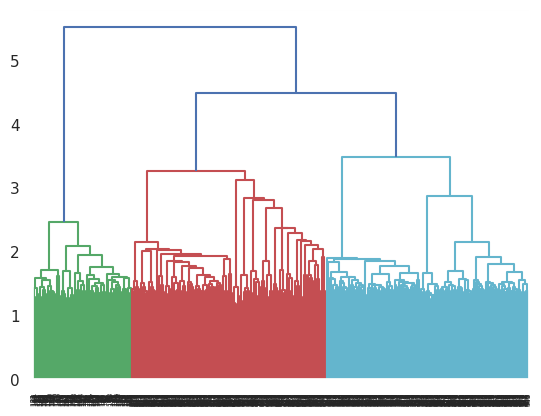

Elbow Method to determine the number of clusters to be formed:


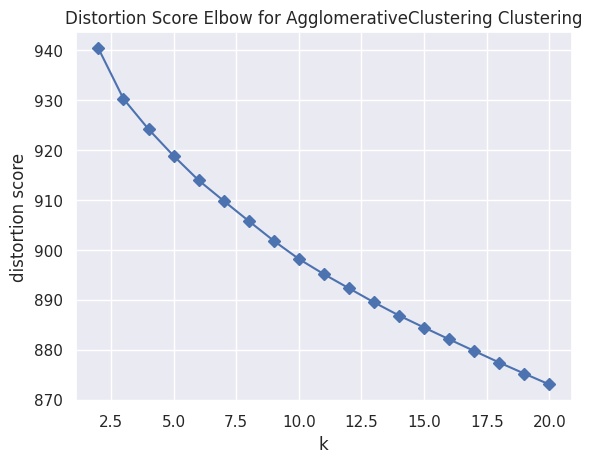

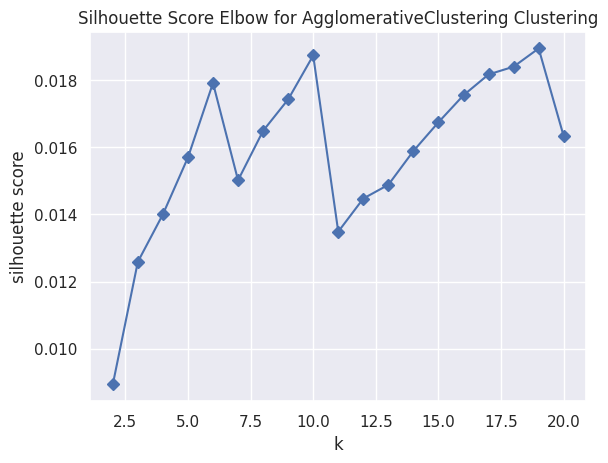

Hierarchical with LDA feature engineering methods


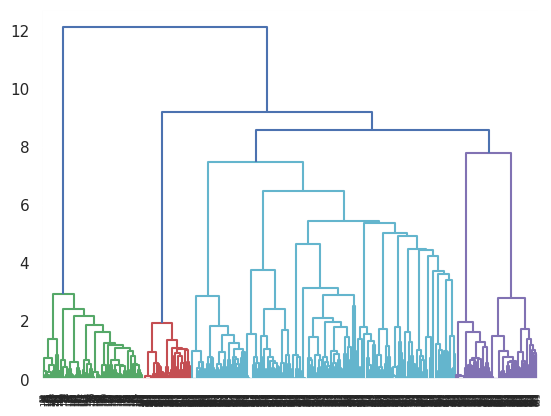

Elbow Method to determine the number of clusters to be formed:


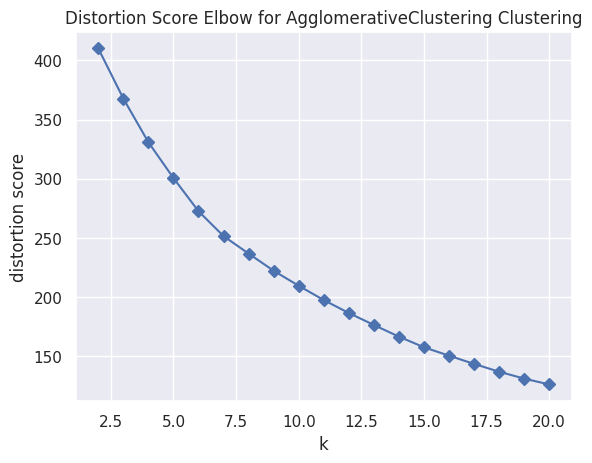

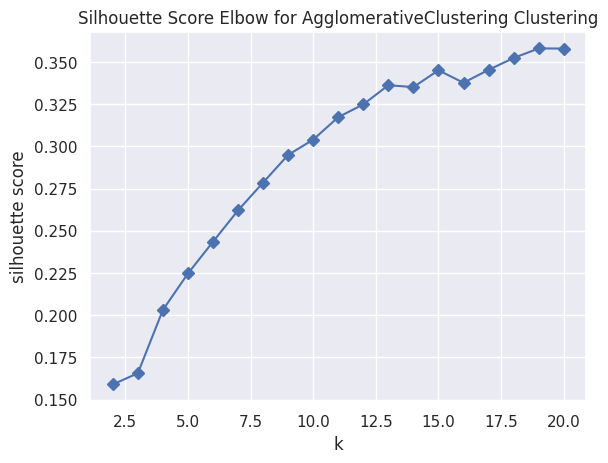

Hierarchical with WordEmbeddingGensim feature engineering methods


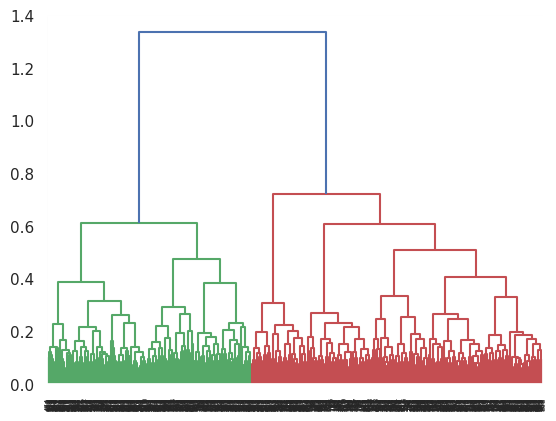

Elbow Method to determine the number of clusters to be formed:


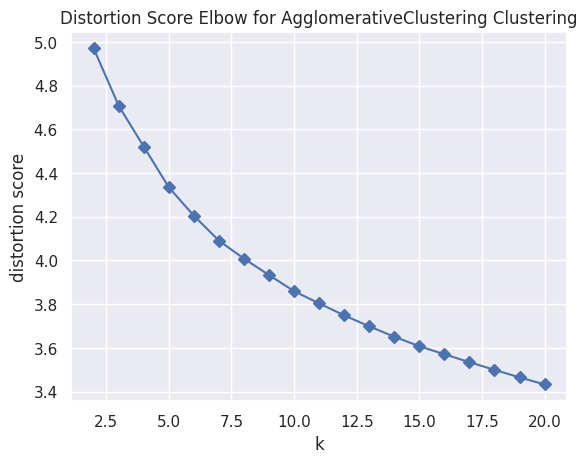

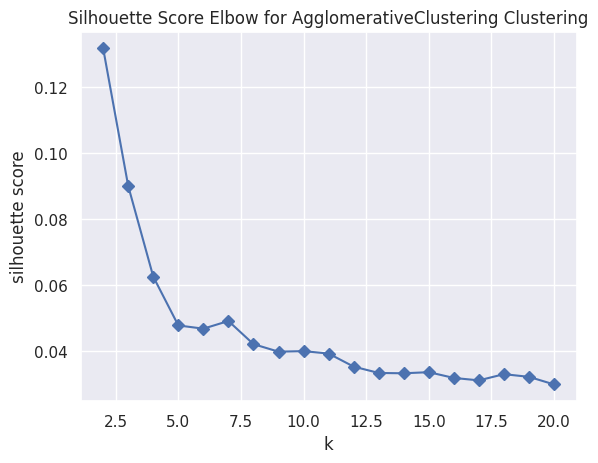

In [172]:
viualzation(X,20,models_names[2],Features_Engneering_names)

In [174]:
chosen_hier = [6, 10, 15, 7]

<hr style="border: solid 3px Brown;">
<a id="17"></a> <br>

## <center><span style="font-family:Arial; font-style: italic;">Perform Evaluations </span></center>


<a id="18"></a> <br>
### get Coherence for models

In [175]:
def get_clusters(text,pred_labels,N_clusters):
    clusters=[]
    for i in range(N_clusters):
        clusters.append(" ")
    for j in range(len(pred_labels)):
        cluster_number = pred_labels[j]
        print(clusters[pred_labels[cluster_number]])
        print(text[j])
        clusters[cluster_number]= clusters[cluster_number]+text[j]
    return clusters

def split_Cluster_corpuses(Lst_Str_clusters,N_clusters):
    clusters =[]
    for i in Lst_Str_clusters:
        clusters.append(i.split())
    return clusters

def coherence_for_all(lst,texts):
    # get list of ( list of words ) from the corpus 
    texts = []
    for x in X :
        texts.append(x.split(" "))
    # get the dictionary 
    dictionary = Dictionary(texts)

    # prepare the features for LDA model 
    # text is a list of lists [[word1,word2,...,wordn],...,[word1,word2,...,wordn]]
    corpus = [dictionary.doc2bow(text) for text in texts]  
    
    goodcm = CoherenceModel(topics=lst, corpus=corpus, dictionary=dictionary, coherence='u_mass')
    
    return goodcm.get_coherence()

def calculate_coherence(text,pred_labels,N_clusters=5):
    c = get_clusters(text,pred_labels,N_clusters)
    c2 =split_Cluster_corpuses(c,N_clusters) 
    lsts = []
    for i in range(N_clusters):
        lsts.append(c2[i])
    return coherence_for_all(lsts,text)

<a id="19"></a> 
### get Cohen kappa Score

In [176]:
def get_Cohen_kappa_Score(y_test,y_pred):
    """
    Function : get_Cohen_kappa_Score
    Used to get model by given name 
    ---------------------------------
    Input : y_test, y_pred
    ---------------------------------
    Output : Kappa_Score
    """
    return cohen_kappa_score(y_test,y_pred)

<a id="20"></a>
### Cosistency

In [177]:
def get_Consistency(y,predicted_labels):

  """
    Function : get_Consistency
    Used to get consistency for this model 
    ---------------------------------
    Input : 
    predicted_labels
    y
    ---------------------------------
    Output : return consistency for this model  
    """

  return v_measure_score(y,predicted_labels)

<a id="21"></a>
### TSNE Plot

In [178]:
def plot_cluster(data,y,title=''):
  """
  Function : plot_cluster
  Used to plot the scatter plot after apply TSNE 
  ---------------------------------
  Input : 
  data 
  y
  title
  ---------------------------------
  Output : don't return
  """
  tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
  tsne_results = tsne.fit_transform(data)  
  plt.figure(figsize=(16,10))

  sns.scatterplot(
  x=tsne_results[:,0], y=tsne_results[:,1],
  hue=y
  )
  plt.xlabel("TSNE1",size=15)
  plt.ylabel("TSNE2",size=15)
  plt.title(title,size=20)
  plt.show()

<hr style="border: solid 3px Brown;">
<a id="22"></a> <br>

## <center><span style="font-family:Arial; font-style: italic;">Compare and decide which clustering result is the closest to the human labels </span></center>


In [ ]:
def map(cluster_pred, true_labels):
  """
  INPUT:
  cluster_pred: Predicted cluster numbers for the training data
  true_labels: True labels of the training data

  OUTPUT:
  model_pred: Predicted labels for the training data
  mapper: Dictionary that contains the mapping from the cluster number to labels

  """  
  mapper = {}

  # Iterating over clusters
  for i in range(cluster_pred.max()+1):
    # Assigning a label for each cluster
    mapper[i] = true_labels[cluster_pred==i].value_counts().index[0]

  # Mapping the cluster numbers to labels
  model_pred = np.array([mapper[cluster_num] for cluster_num in cluster_pred])

  return model_pred, mapper

In [179]:
def plotCompare(Features_Engneering_names,models_names,results,x_ax):
    """
    Function : model_train
    Used to Train based on model_name and features
    ---------------------------------
    Input : Features_Engneering_names is features engineering methods used 
            models_names the name of algorithm it used 
            results is the result of evaluated the trained methods  
            x_ax
    ---------------------------------
    Output : don't return thing
  """
  num_plots =len(Features_Engneering_names)*len(models_names)
  total_cols = len(Features_Engneering_names)
  total_rows = len(models_names)

  fig, axs = plt.subplots(nrows=total_rows, ncols=total_cols,
                          figsize=(7*total_cols, 7*total_rows), constrained_layout=True)
  fig.suptitle('comparing between models',fontweight="bold",size=42)

  for i, var in enumerate(results.keys()):
      row = i//total_cols
      pos = i % total_cols
      plt.figure(figsize=(12,5))
      d=[]
      value=results[var]
      for v in value:
        d.append(v*100)
      

      axs[row, pos].set_title(var, size=26)
      
      g = sns.barplot(x=x_ax, y=d,ax=axs[row][pos])
      g.set_ylim(0, 100)
      counter=0
      for va in value:
        if counter==2:
          v=round(va,2)
        else:
          v=str(round(va,2)*100)+' %'
        g.text(counter,va*100,v, color='black', ha="center")
        counter+=1




In [180]:
def model_train(x,k,model_name,feature):
    """
    Function : model_train
    Used to Train based on model_name and features
    ---------------------------------
    Input : x is data 
            k is number of cluster
            model_name is model use to train
            feature is feature engineer methods use to get data before train
    ---------------------------------
    Output : model
    """
    #Hierarchical clustering
    print('train {} with {} feature engineering methods'.format(model_name,feature))
    if model_name =="K-means": 
      model=kmeans_model(x, k)
      plot_cluster(x,model.labels_,'{} with {} feature engineering methods'.format(model_name,feature))
    elif model_name =="em":
      model=em_model(x, k)
      pred = model.predict(x)
      plot_cluster(x,pred,'{} with {} feature engineering methods'.format(model_name,feature))
    elif model_name =="Hierarchical":
      hc = AgglomerativeClustering(affinity = 'euclidean', linkage = 'ward')
      model=Hierarchical_clustering_tr(x,k)
      plot_cluster(x,model.labels_,'{} with {} feature engineering methods'.format(model_name,feature))
    return model

In [181]:
def evloute(y_pred,x,y,k):
    """
  Function : evloute
  Used to Train based on model_name and features
  ---------------------------------
  Input : y_pred,x,y,k
  ---------------------------------
  Output : vm,kappa,s
  """
  model_pred,m=map(y_pred, y)
  vm=get_Consistency(y,y_pred)
  kappa=get_Cohen_kappa_Score(y,model_pred)
  s=silhouette_score(x, y_pred)
  #c=calculate_coherence(x,y_pred,k)
  ConfusionMatrixDisplay.from_predictions(y,model_pred)
  return [vm,kappa,s]#c




In [182]:
def Train(x,y,k,model_name,Features_Engneering_names):
    """
  Function : model_train
  Used to Train based on model_name and features
  ---------------------------------
  Input : x is data 
          k is number of cluster
          model_name is model use to train
          feature is feature engineer methods use to get data before train
  ---------------------------------
  Output : model
  """
  evaluation_ls={}
  for i,feature in enumerate(Features_Engneering_names):
    data=get_data(x,feature)   
    model=model_train(data,k[i],model_name,feature)
    if model_name=='Hierarchical':
      y_pred=model.labels_
    else:
      y_pred=model.predict(data)

    evaluation_ls[model_name+'-'+feature]=evloute(y_pred,data,y,k[i])
  return evaluation_ls

### running all models with all features methods

In [183]:
Totalevo={}
sns.reset_defaults()

train K-means with BOW feature engineering methods


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.011s...
[t-SNE] Computed neighbors for 1000 samples in 0.921s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 3.480820
[t-SNE] KL divergence after 250 iterations with early exaggeration: 82.998116
[t-SNE] KL divergence after 300 iterations: 1.705492


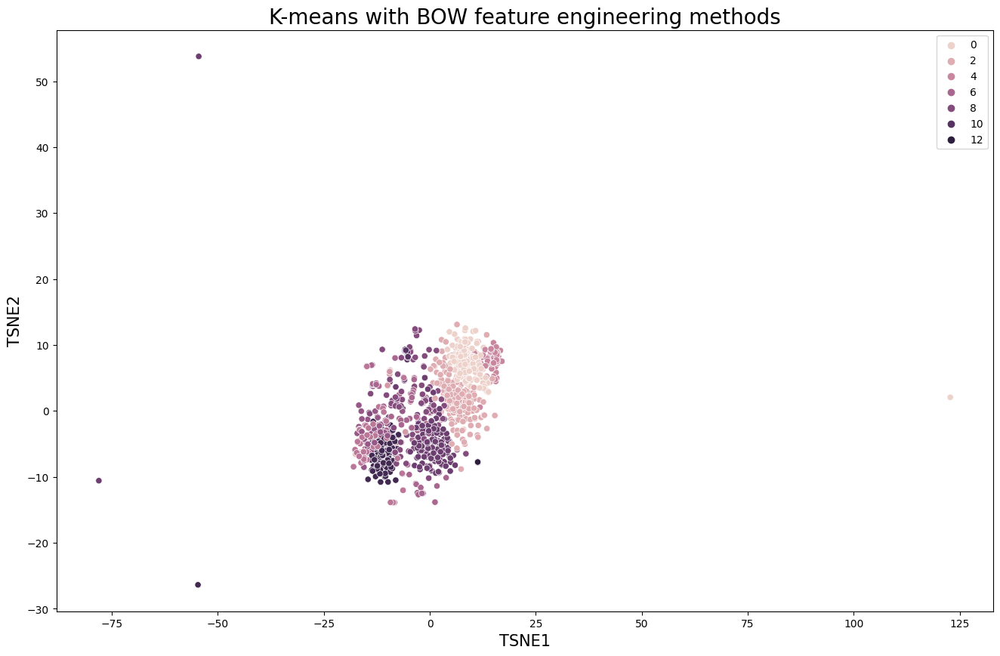

train K-means with TF-IDF feature engineering methods


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.008s...
[t-SNE] Computed neighbors for 1000 samples in 0.449s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 0.232586
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.232910
[t-SNE] KL divergence after 300 iterations: 1.271656


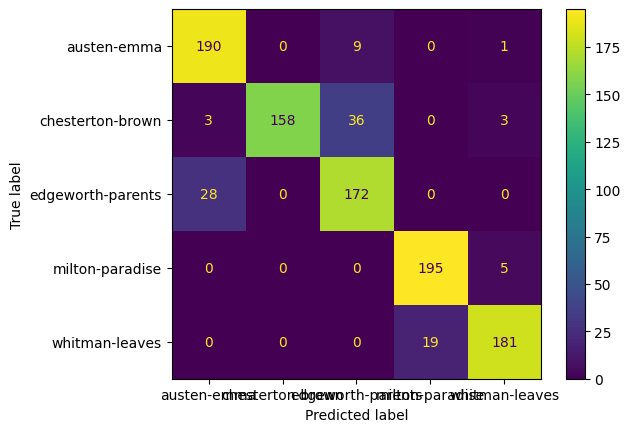

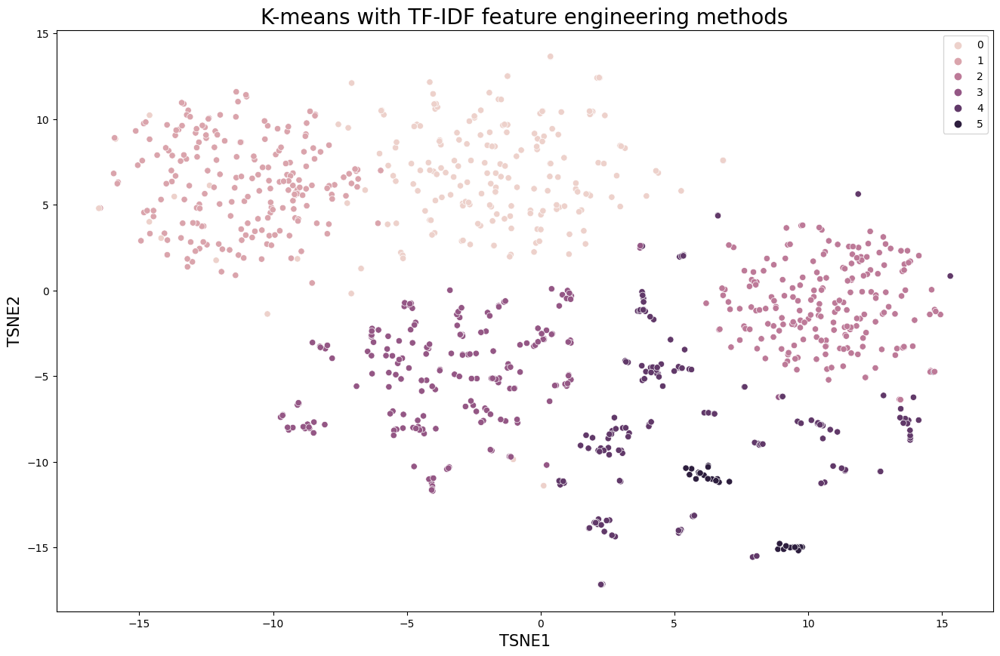

train K-means with LDA feature engineering methods


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.000s...
[t-SNE] Computed neighbors for 1000 samples in 0.048s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 0.213778
[t-SNE] KL divergence after 250 iterations with early exaggeration: 61.089157
[t-SNE] KL divergence after 300 iterations: 0.653699


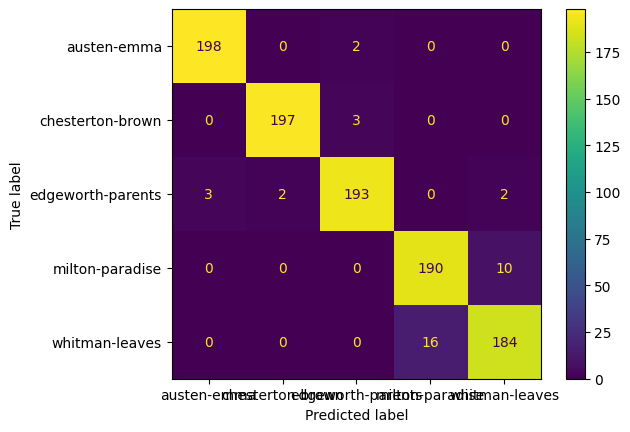

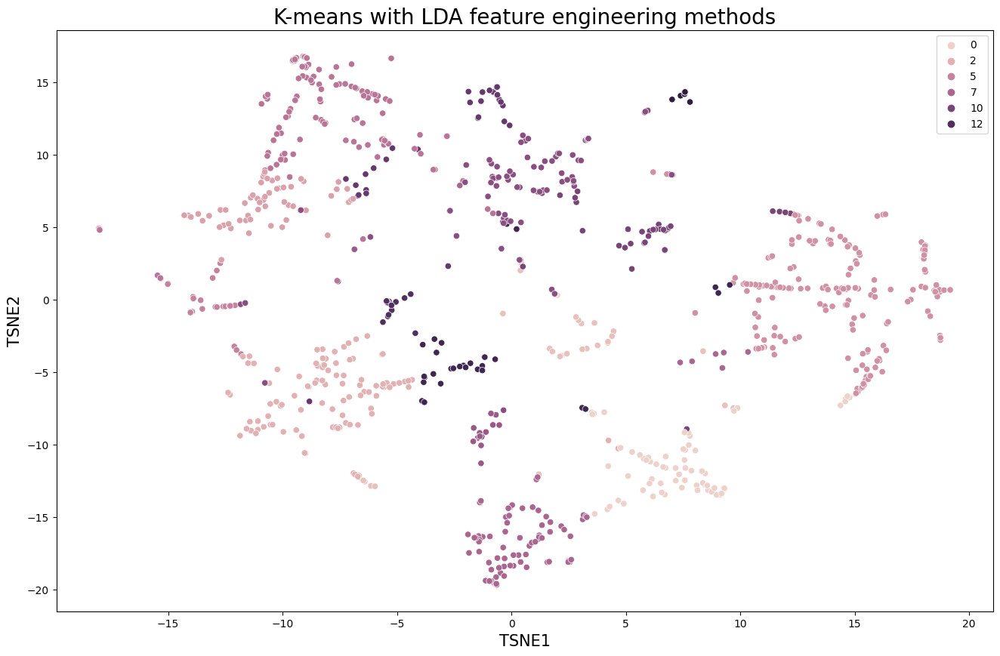

train K-means with WordEmbeddingGensim feature engineering methods


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.001s...
[t-SNE] Computed neighbors for 1000 samples in 0.077s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 0.025209
[t-SNE] KL divergence after 250 iterations with early exaggeration: 72.260376
[t-SNE] KL divergence after 300 iterations: 1.796982


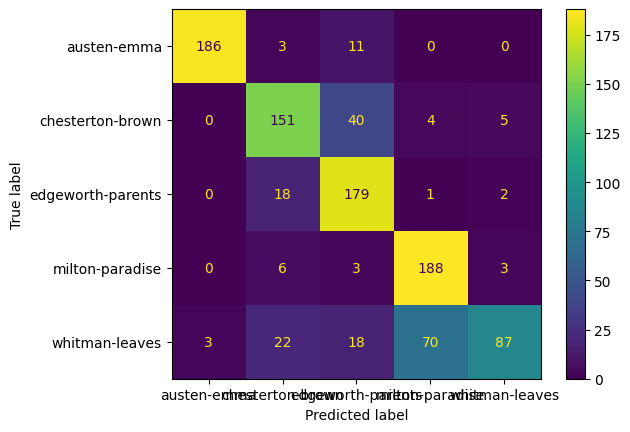

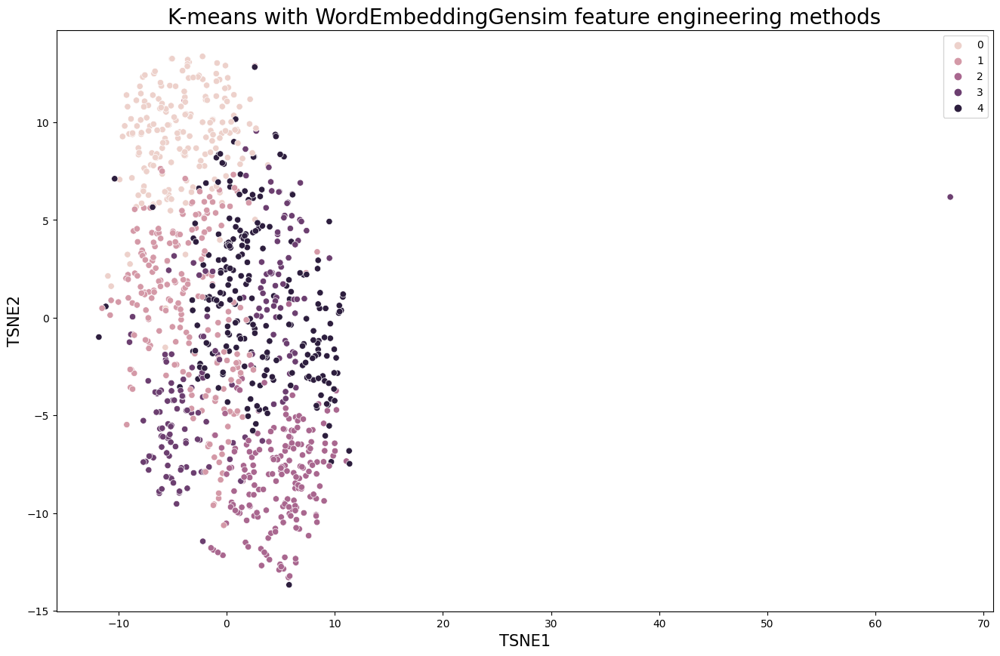

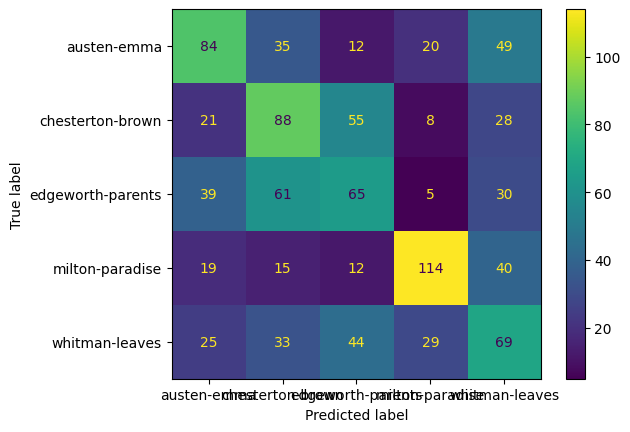

In [184]:
evaluation_ls=Train(X,y,chosen_kmean,models_names[0],Features_Engneering_names)
Totalevo.update(evaluation_ls)

train em with BOW feature engineering methods


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.014s...
[t-SNE] Computed neighbors for 1000 samples in 0.839s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 3.480820
[t-SNE] KL divergence after 250 iterations with early exaggeration: 84.630981
[t-SNE] KL divergence after 300 iterations: 1.626314


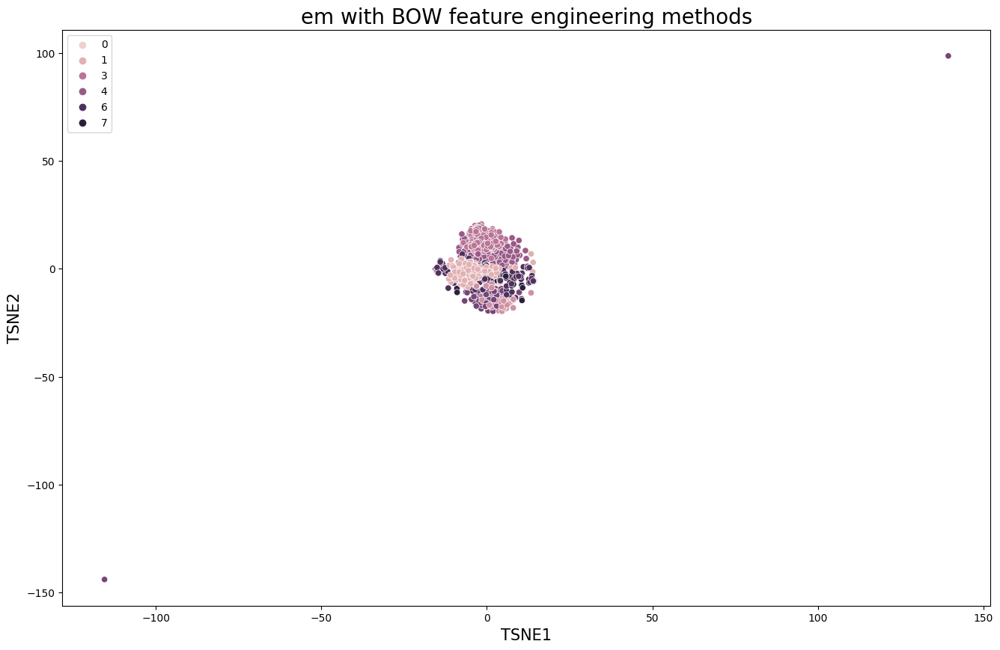

train em with TF-IDF feature engineering methods


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.016s...
[t-SNE] Computed neighbors for 1000 samples in 0.487s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 0.232586
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.043213
[t-SNE] KL divergence after 300 iterations: 1.247590


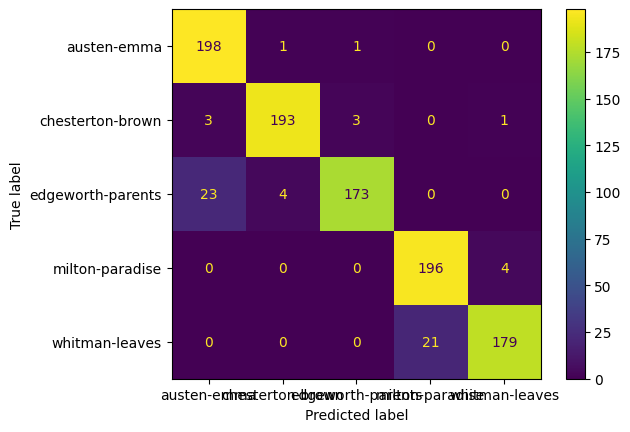

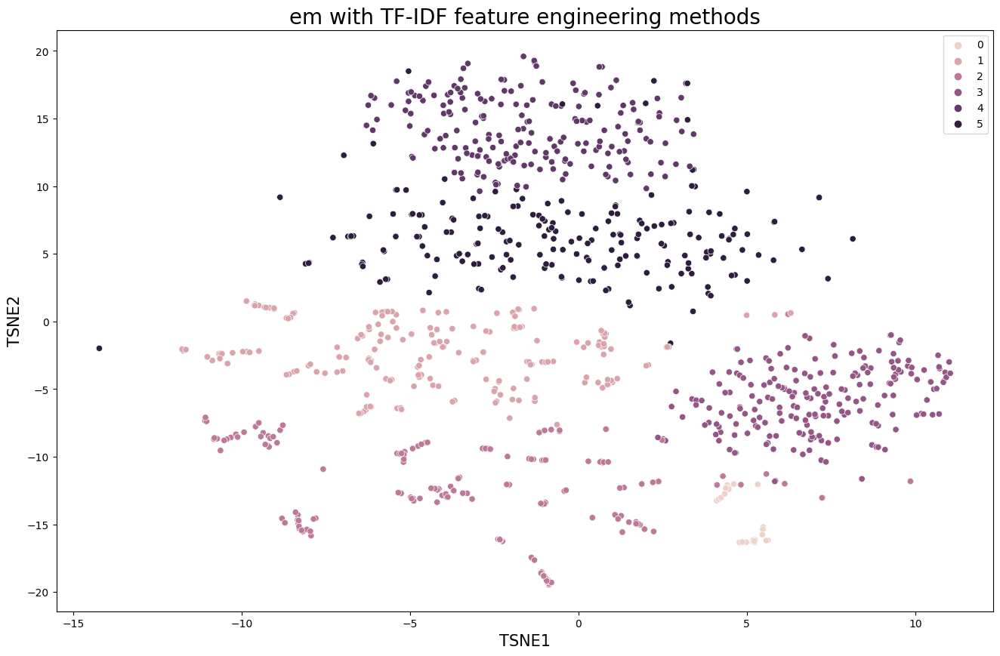

train em with LDA feature engineering methods
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.000s...
[t-SNE] Computed neighbors for 1000 samples in 0.053s...


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 0.213778
[t-SNE] KL divergence after 250 iterations with early exaggeration: 61.221821
[t-SNE] KL divergence after 300 iterations: 0.650937


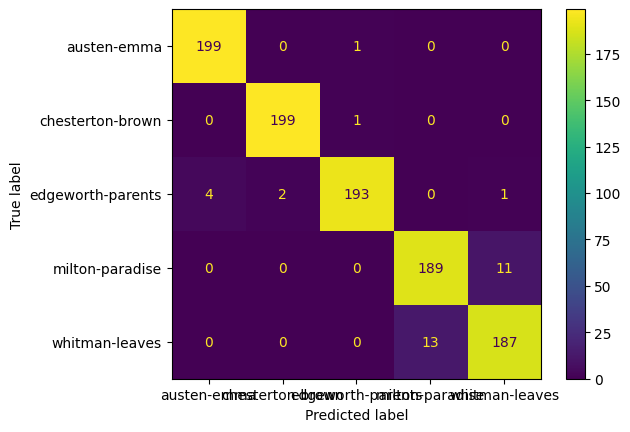

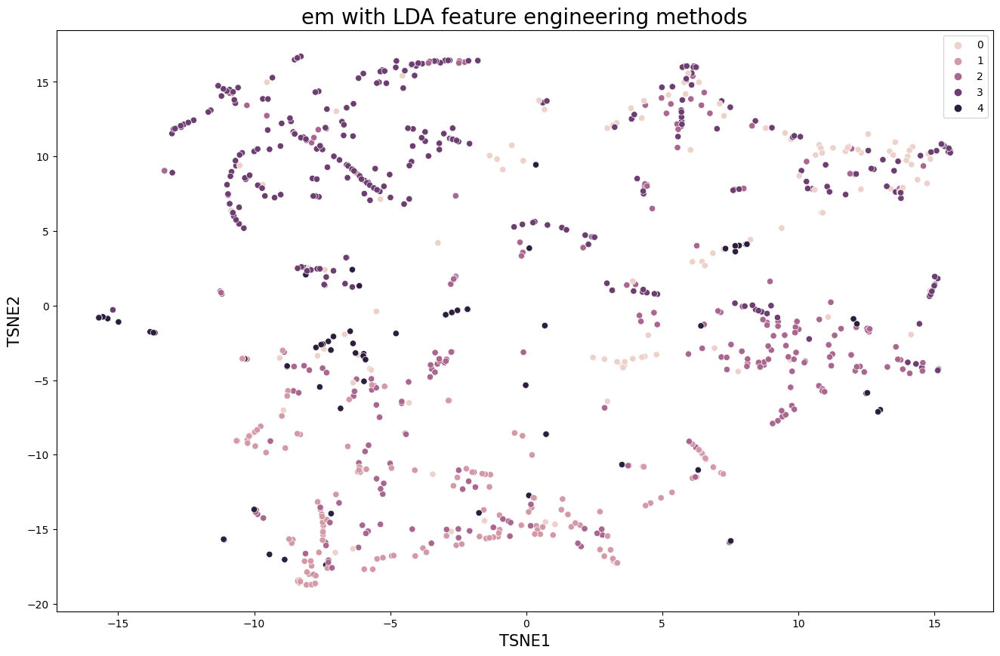

train em with WordEmbeddingGensim feature engineering methods
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.001s...


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computed neighbors for 1000 samples in 0.093s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 0.025209
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.887566
[t-SNE] KL divergence after 300 iterations: 1.792041


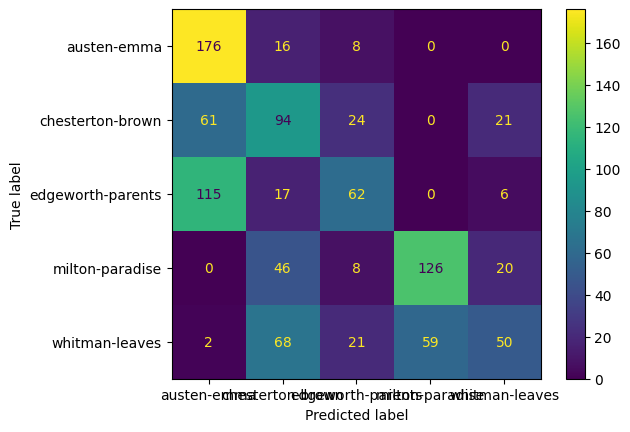

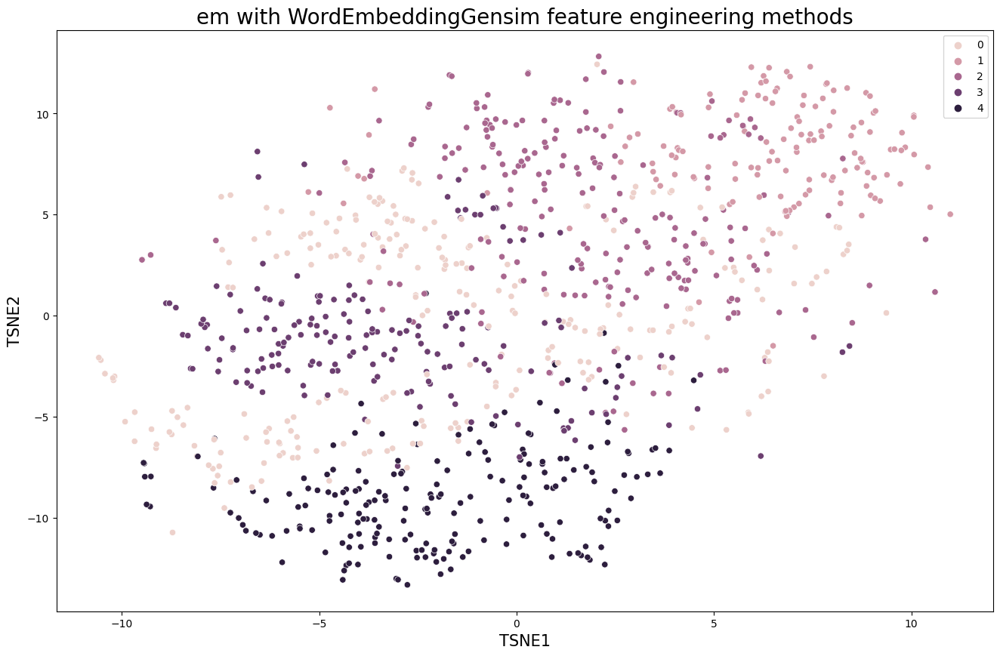

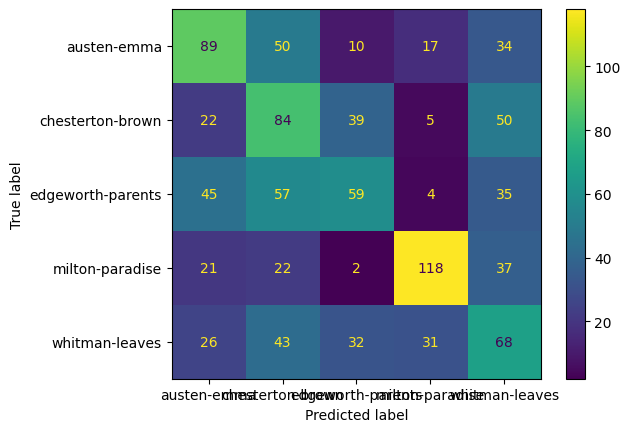

In [185]:
evaluation_ls2=Train(X,y,chosen_em,models_names[1],Features_Engneering_names)
Totalevo.update(evaluation_ls2)

train Hierarchical with BOW feature engineering methods


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.011s...
[t-SNE] Computed neighbors for 1000 samples in 0.835s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 3.480820
[t-SNE] KL divergence after 250 iterations with early exaggeration: 83.315720
[t-SNE] KL divergence after 300 iterations: 1.612134


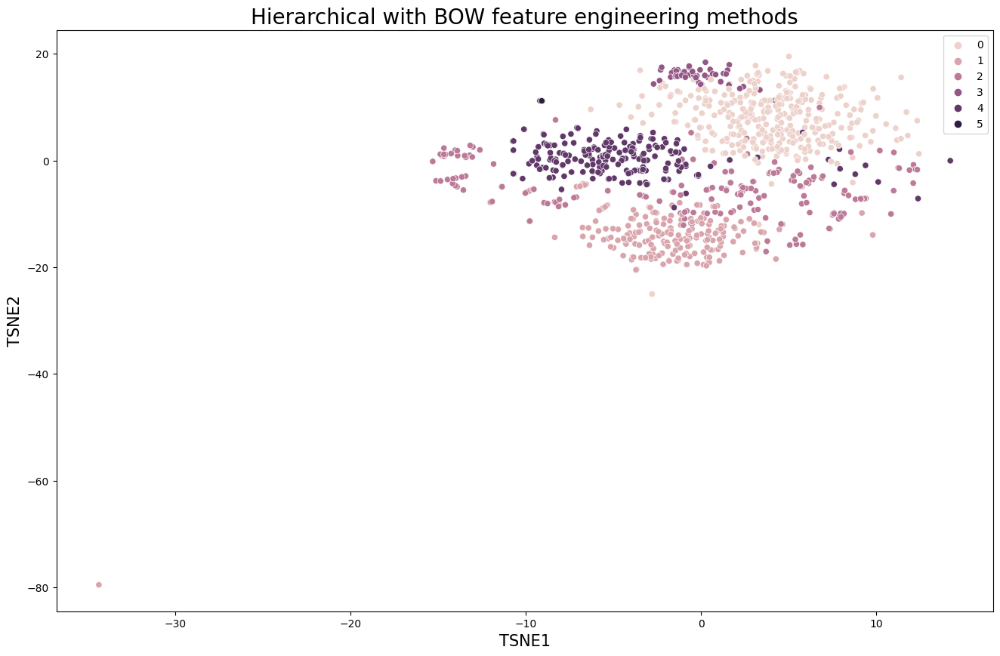

train Hierarchical with TF-IDF feature engineering methods


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.010s...
[t-SNE] Computed neighbors for 1000 samples in 0.773s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 0.232586
[t-SNE] KL divergence after 250 iterations with early exaggeration: 68.746864
[t-SNE] KL divergence after 300 iterations: 1.243860


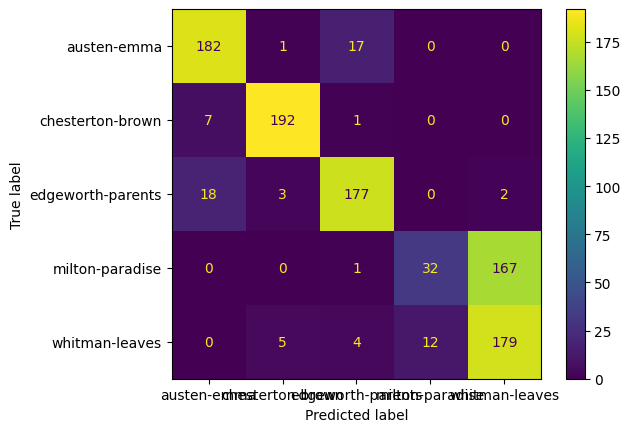

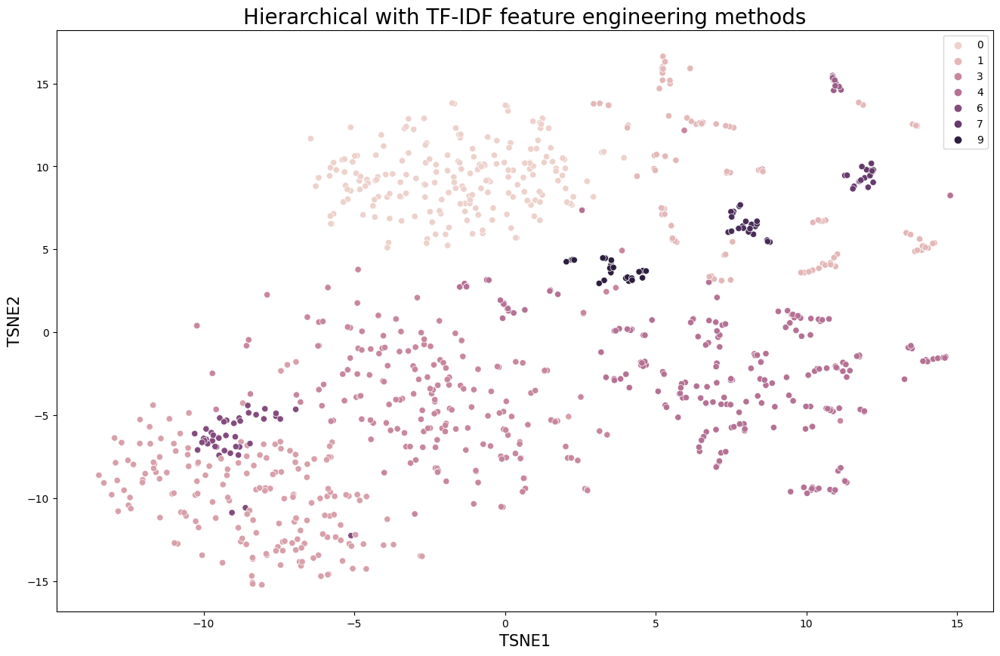

train Hierarchical with LDA feature engineering methods
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.000s...
[t-SNE] Computed neighbors for 1000 samples in 0.055s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 0.213778


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] KL divergence after 250 iterations with early exaggeration: 61.084137
[t-SNE] KL divergence after 300 iterations: 0.652801


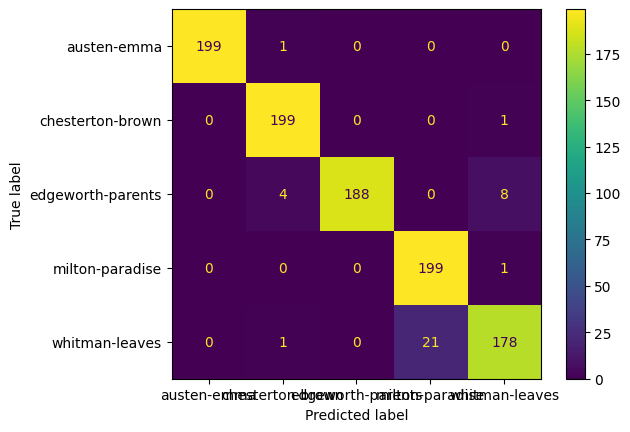

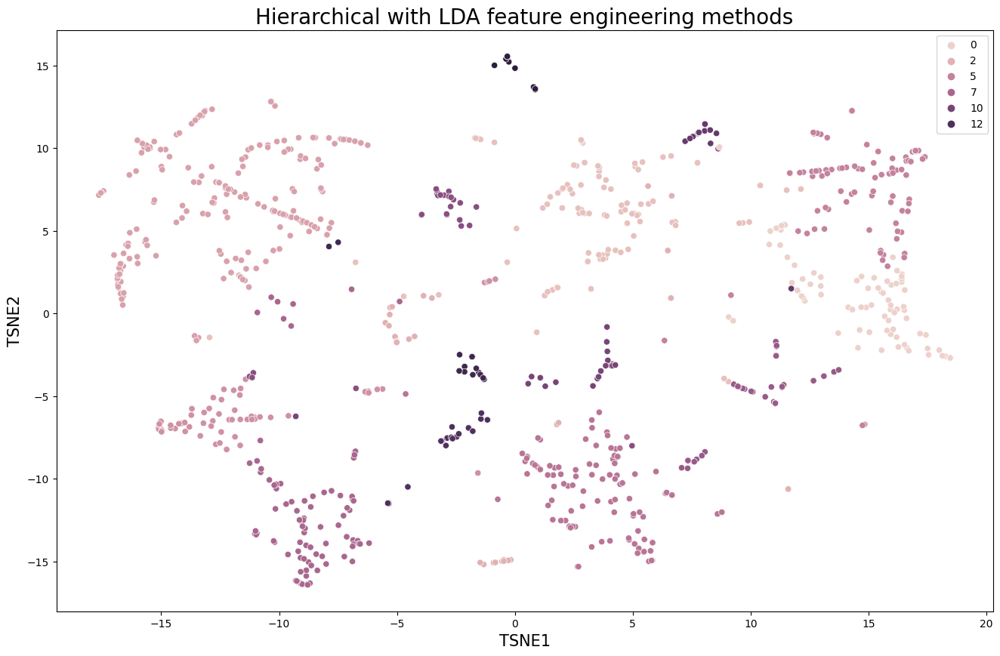

train Hierarchical with WordEmbeddingGensim feature engineering methods
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.001s...


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computed neighbors for 1000 samples in 0.085s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 0.025209
[t-SNE] KL divergence after 250 iterations with early exaggeration: 72.927078
[t-SNE] KL divergence after 300 iterations: 1.834867


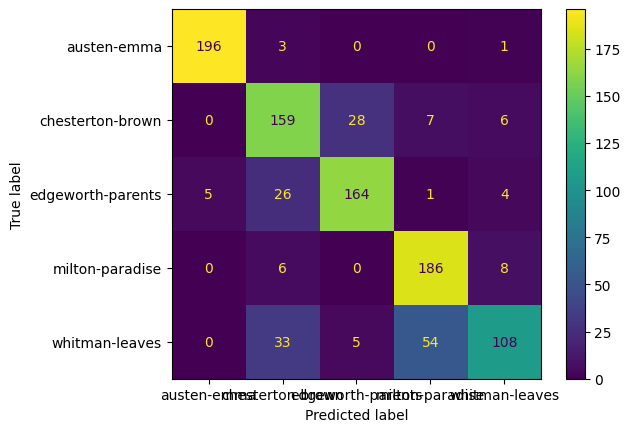

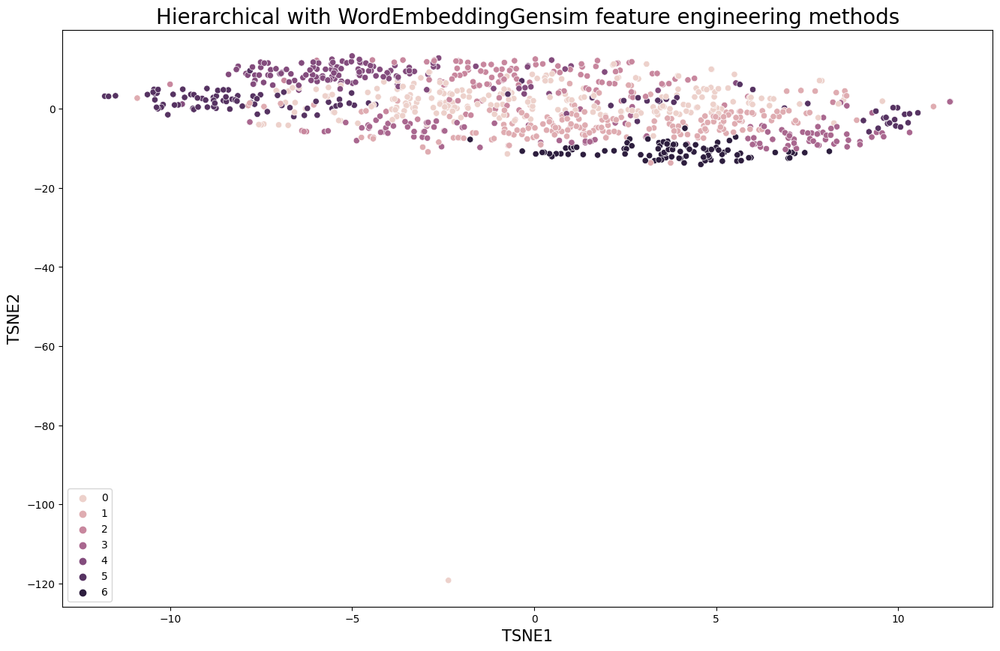

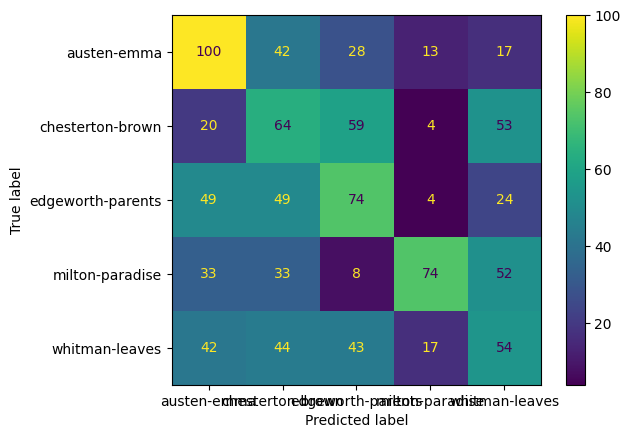

In [186]:
evaluation_ls3=Train(X,y,chosen_hier,models_names[2],Features_Engneering_names)
Totalevo.update(evaluation_ls3)

### plot the comparing 

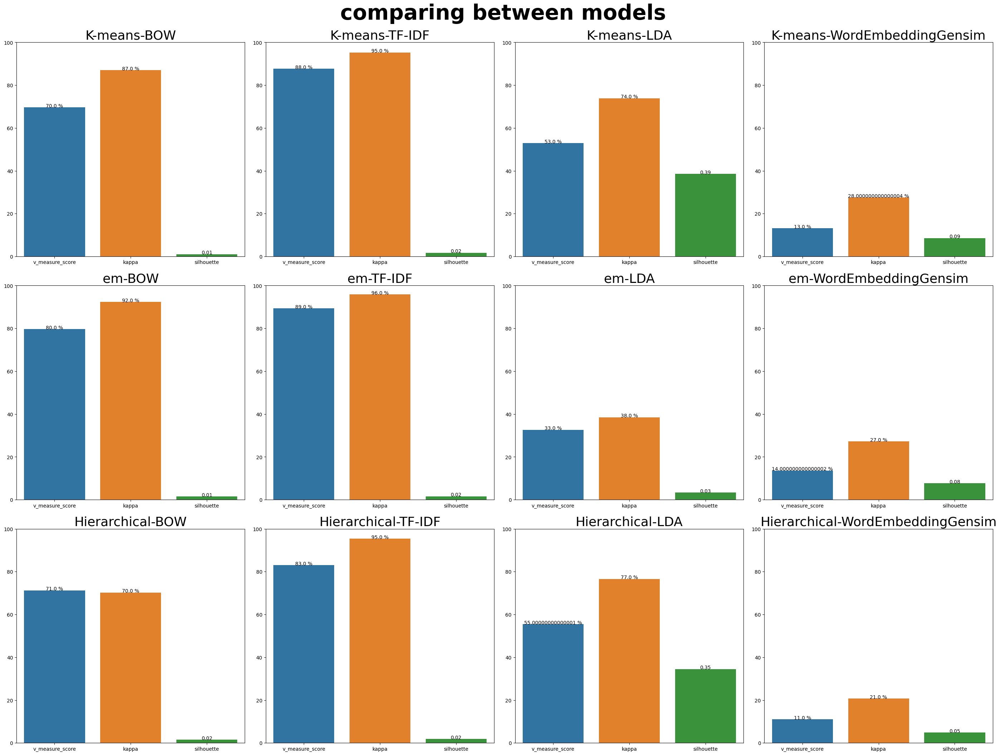

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

In [187]:
plotCompare(Features_Engneering_names,models_names,Totalevo,['v_measure_score','kappa','silhouette'])

### get champion model

In [188]:
def get_champion_model(results):
  f=True
  for key,value in results.items():
    if f:
      best=key
      f=False
    if value[1]>=results[best][1]:
      best=key
    elif value[1]==results[best][1]:
      if value[0]>=results[best][0]:
        best=key
  return best

In [189]:
best=get_champion_model(Totalevo)
best

'em-TF-IDF'

train em with TF-IDF feature engineering methods


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.021s...
[t-SNE] Computed neighbors for 1000 samples in 0.803s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 0.232586
[t-SNE] KL divergence after 250 iterations with early exaggeration: 68.887543
[t-SNE] KL divergence after 300 iterations: 1.286598


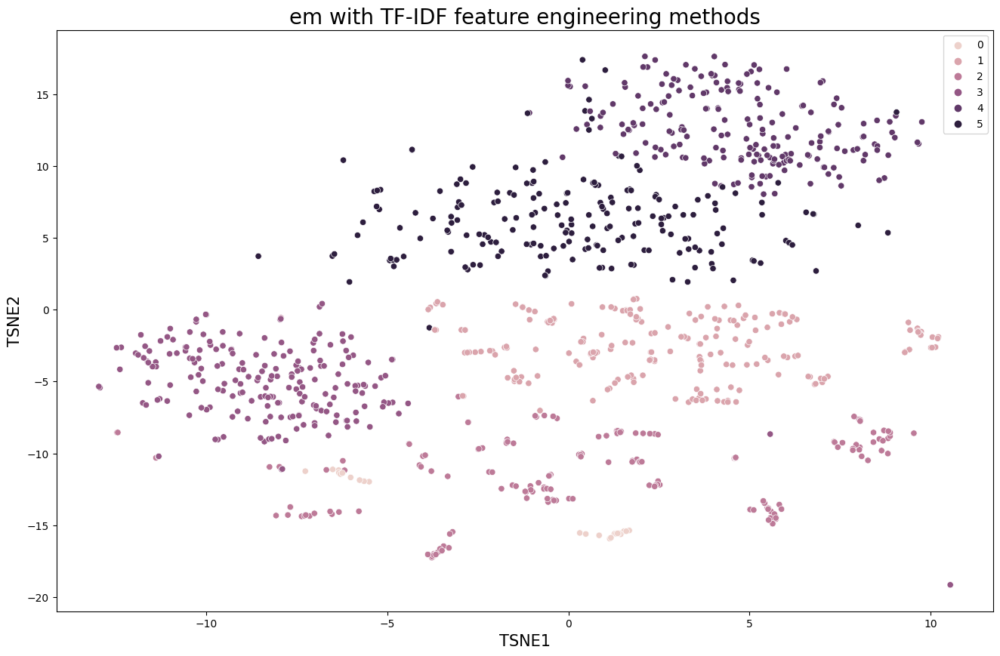

[0.893300563162406, 0.95875, 0.01580123778864152]


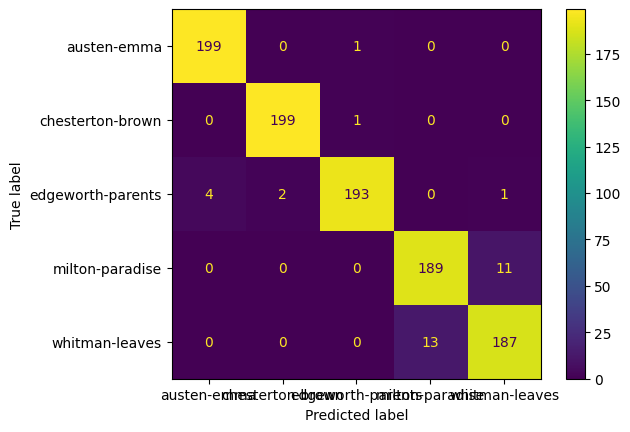

In [190]:
data=get_data(X,'TF-IDF')   
model=model_train(data,chosen_em[1],'em','TF-IDF')
y_pred=model.predict(data)

print(evloute(y_pred,data,y,chosen_em[1]))


### comparing between the best kappa and best silhouette

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.009s...
[t-SNE] Computed neighbors for 1000 samples in 0.451s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 0.232586
[t-SNE] KL divergence after 250 iterations with early exaggeration: 69.105019
[t-SNE] KL divergence after 300 iterations: 1.243561


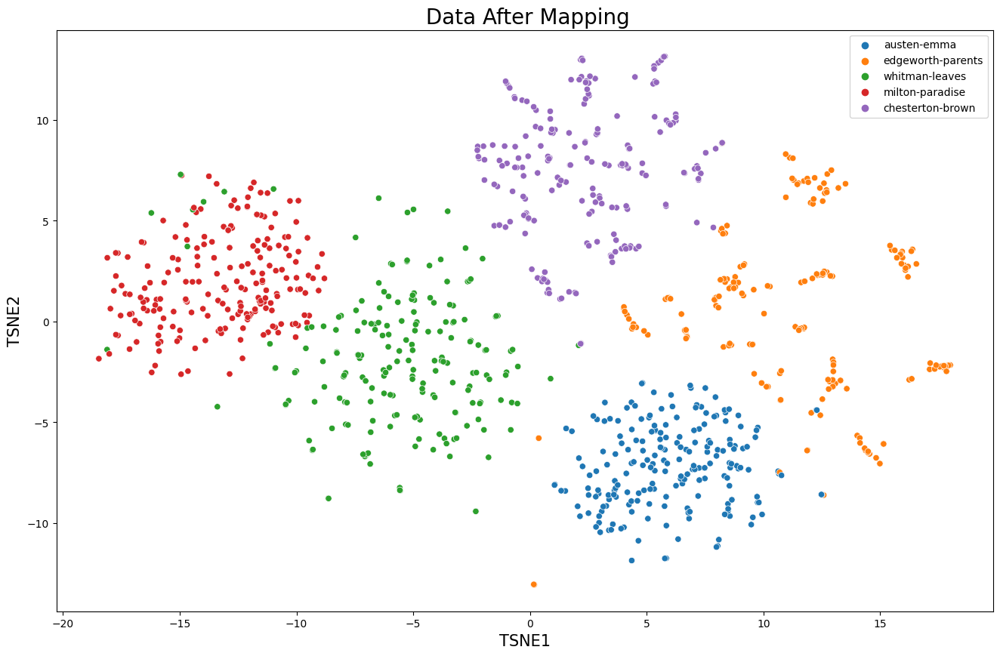

In [191]:
model_pred, mapper=map(y_pred,y)
plot_cluster(data,model_pred,title=' Data After Mapping')

train K-means with LDA feature engineering methods


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.005s...
[t-SNE] Computed neighbors for 1000 samples in 0.075s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 0.213778
[t-SNE] KL divergence after 250 iterations with early exaggeration: 60.999252
[t-SNE] KL divergence after 300 iterations: 0.648711


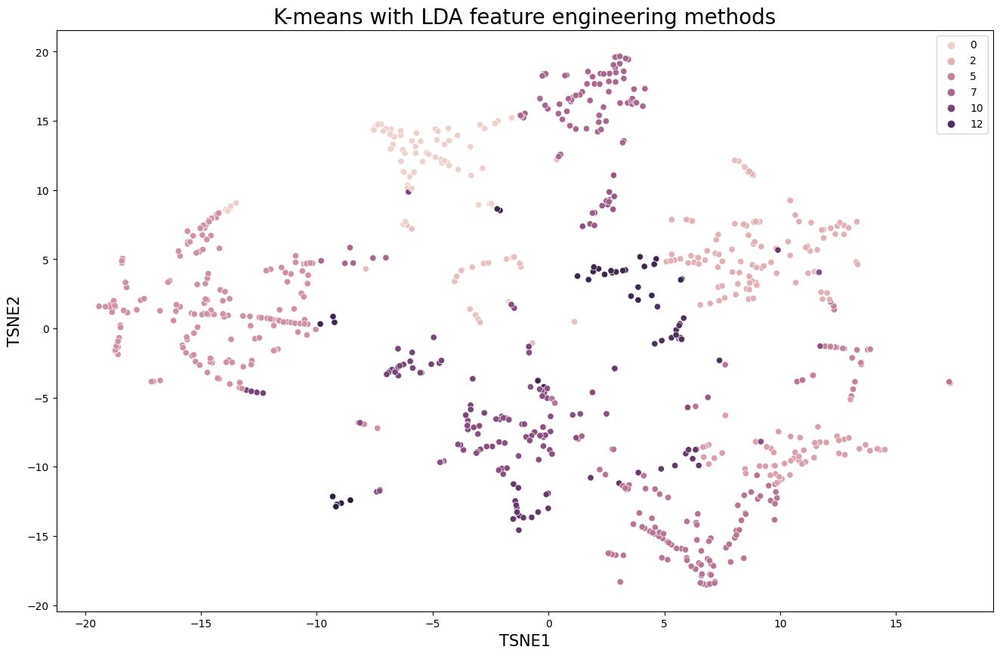

[0.5295336563843546, 0.73875, 0.38603994601322034]


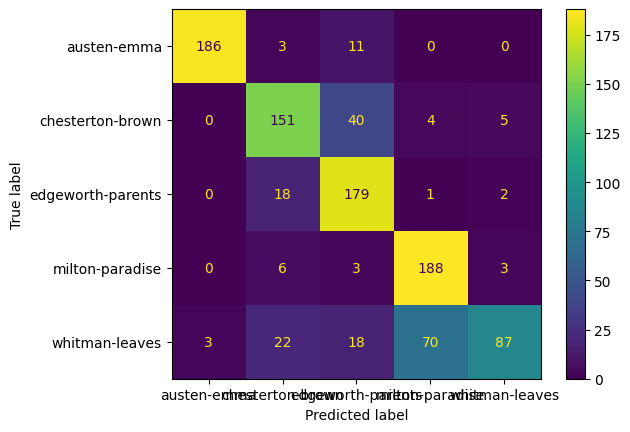

In [192]:
data=get_data(X,'LDA')   
model=model_train(data,chosen_kmean[2],'K-means','LDA')
y_pred=model.predict(data)

print(evloute(y_pred,data,y,chosen_kmean[2]))

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.000s...
[t-SNE] Computed neighbors for 1000 samples in 0.049s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 0.213778
[t-SNE] KL divergence after 250 iterations with early exaggeration: 61.140530
[t-SNE] KL divergence after 300 iterations: 0.646928


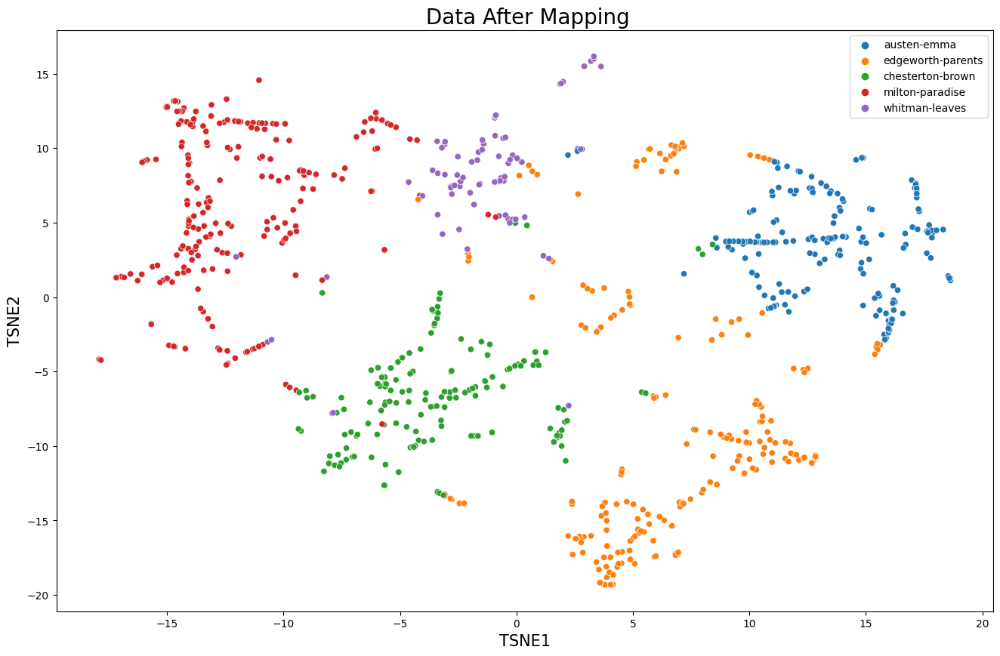

In [193]:
model_pred, mapper=map(y_pred,y)
plot_cluster(data,model_pred,title=' Data After Mapping')

<hr style="border: solid 3px Brown;">
<a id="23"></a> <br>

## <center><span style="font-family:Arial; font-style: italic;">Error-Analysis </span></center>


<a id="15"></a> <br>
### print wrong points

In [194]:
def printWrongPoints(X_test,y_test,y_pred,labels):
    """print the Wrong partitions of predictions
    Input: model, X_test, y_test, y_pred
    Output: print the Wrong partitions of prediction
    """
    wrongPoints = []
    wrongPointsIndex = []
    
    for index, val in enumerate(X_test):
        if y_pred[index] !=y_test[index]:
            pred_wrong=val    
                   
            
            text = " ".join(str(v) for v in pred_wrong)
            # Creating word_cloud with text as argument in .generate() method
            wc = WordCloud(collocations = False, background_color = 'white').generate(text)
            # Display the generated Word Cloud
            plt.imshow(wc, interpolation='bilinear')
            plt.axis("off")
            plt.show()   
            wrongPoints.append(pred_wrong)
            wrongPointsIndex.append(y_pred[index])
       



            
    booksDataframeResult = pd.DataFrame(data=pd.Series(data=wrongPoints),columns=['Partitions' ]) 
     
     

    classesWrongPredictionCounts=np.zeros(len(labels),dtype =int)
     
    for index, val in enumerate(wrongPoints):
        booksDataframeResult.at[index,wrongPointsIndex[index]]='--X--'

   
     
    
    print("\n\n**\n\nWrong Predictions\n\n")
 
    return booksDataframeResult,wrongPoints

train em with TF-IDF feature engineering methods


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.010s...
[t-SNE] Computed neighbors for 1000 samples in 0.448s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 0.232586
[t-SNE] KL divergence after 250 iterations with early exaggeration: 68.776581
[t-SNE] KL divergence after 300 iterations: 1.236259


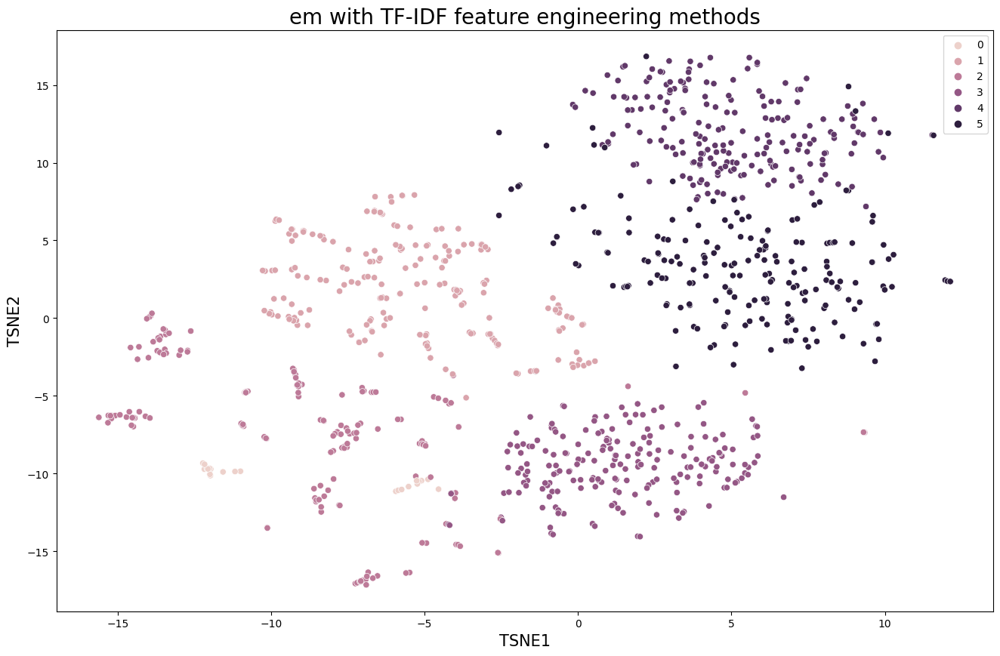

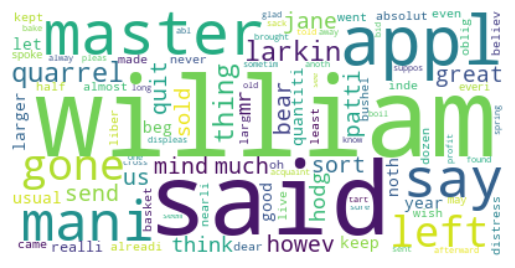

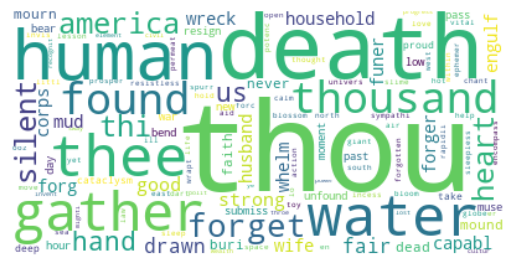

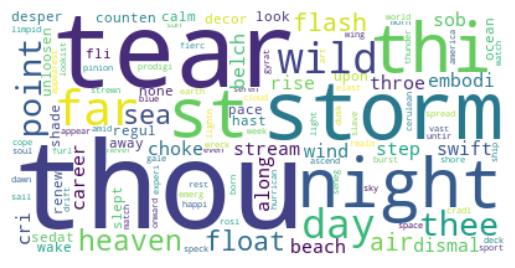

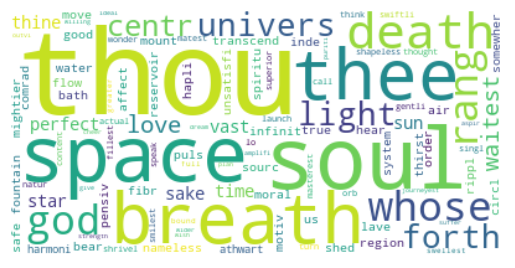

...

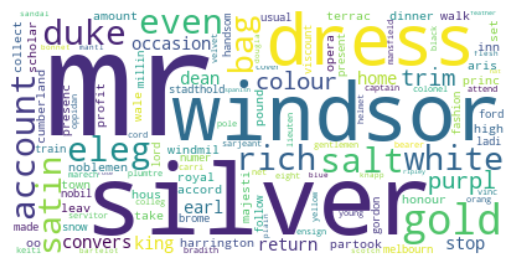

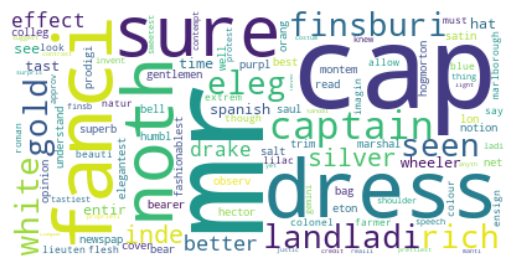

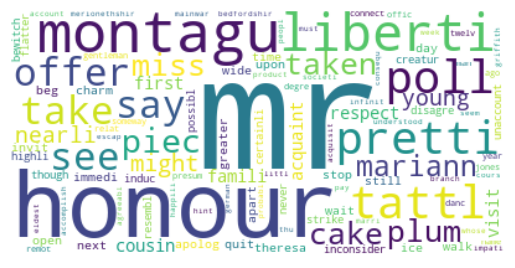

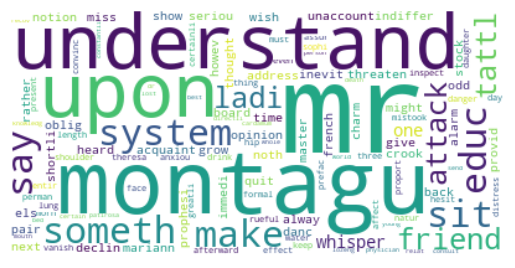

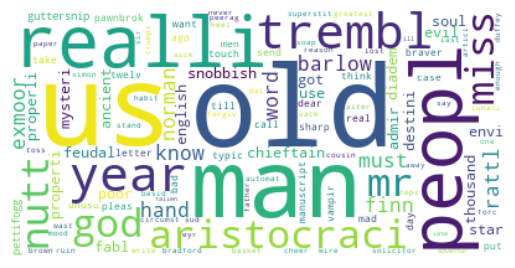



**

Wrong Predictions




,Partitions,edgeworth-parents,milton-paradise,whitman-leaves,chesterton-brown,austen-emma
0,"[let, keep, larger, quantiti, usual, year, sen...",--X--,NaN,NaN,NaN,NaN
1,"[drawn, thee, fair, strong, good, capabl, hous...",NaN,--X--,NaN,NaN,NaN
2,"[stream, tear, sob, tear, throe, choke, wild, ...",NaN,--X--,NaN,NaN,NaN
3,"[space, death, like, water, flow, bear, inde, ...",NaN,--X--,NaN,NaN,NaN
4,"[shalt, face, thi, fortun, thi, diseas, surmou...",NaN,--X--,NaN,NaN,NaN
5,"[mighti, live, present, yet, thou, live, prese...",NaN,--X--,NaN,NaN,NaN
6,"[murk, thi, unloo, hurrican, thi, unsubdued, c...",NaN,--X--,NaN,NaN,NaN
7,"[springi, step, slave, eye, voic, hand, step, ...",NaN,--X--,NaN,NaN,NaN
8,"[sea, limitless, heav, breast, ship, see, whit...",NaN,--X--,NaN,NaN,NaN
9,"[green, back, spot, mossbonk, thou, orb, aloft...",NaN,--X--,NaN,NaN,NaN


In [195]:

data=get_data(X,'TF-IDF')   
model=model_train(data,chosen_em[1],'em','TF-IDF')
y_pred=model.predict(data)
model_pred, mapper=map(y_pred,y)
booksDataframeResult,wrongPoints=printWrongPoints(df.iloc[:,1],y,model_pred,chosen_books)
booksDataframeResult

In [196]:
booksDataframeResult.shape

(33, 6)

### show top 10 word frequency in wrong prediction 

<Figure size 1500x1000 with 0 Axes>

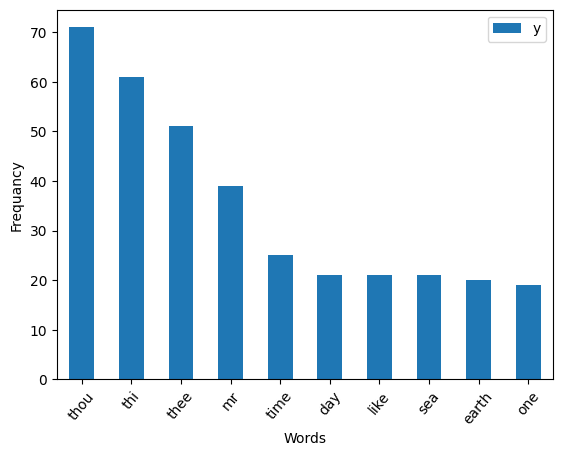

In [197]:
for token in wrongPoints:
    vocab.update(token)
mostc=vocab.most_common(10)

plt.figure(figsize=(15,10))

pd.DataFrame(mostc,columns=['x','y']).plot.bar(x='x', rot=0)
plt.xticks(rotation=50)
plt.xlabel("Words")
plt.ylabel("Frequancy")
plt.show()




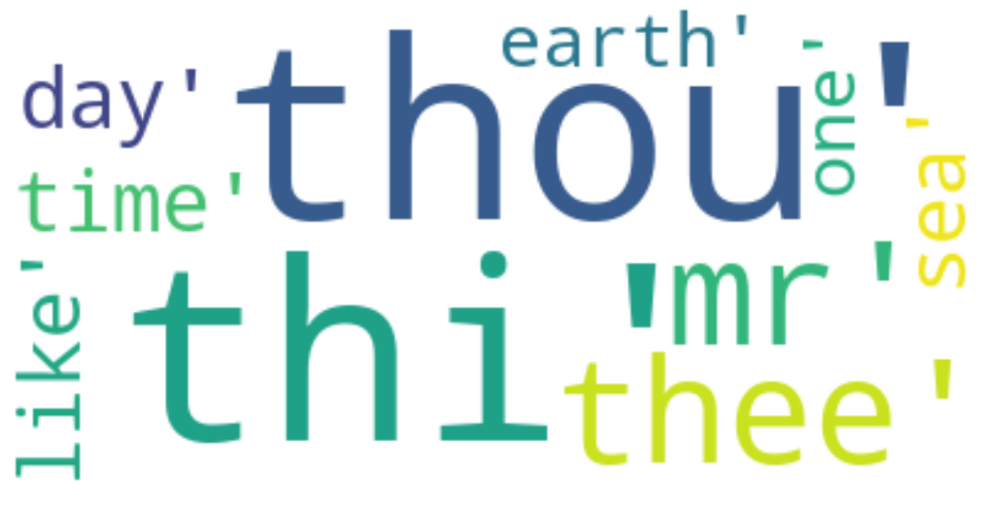

In [198]:
plt.figure(figsize=(15,10))

text = " ".join(str(v) for v in mostc)
# Creating word_cloud with text as argument in .generate() method
wc = WordCloud(collocations = False, background_color = 'white').generate(text)
# Display the generated Word Cloud
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()   

